In [1]:
import os
os.environ["KMP_DUPLICATE_LIB_OK"]="TRUE"

In [2]:
def find_diagnose(filename):

    with open(filename, "r") as file:
        lines = file.readlines()

    for line in lines:
        tofind = "# Reason for admission: "
        start = len(tofind)
        if tofind in line:
            diagnose = line[start:].strip()
    if diagnose == "n/a":
        return None
    else: #some signals in the dataset don't have a diagnose
        return diagnose

In [3]:
def remove_baselineshift_window(window):
    #compute median
    modes = np.median(window, axis = 1)
    
    to_return = np.zeros_like(window)
    #signal - mode
    for ch, mode in enumerate(modes):
        w_ch = window[ch, :]
        if mode < 0:
            to_return[ch, :] = w_ch - mode
        else:
            to_return[ch, :] = w_ch + mode
        #return
    return to_return

In [4]:
import wfdb

In [5]:
def multichannel_resample(signal, new_lenght):
    nchs = 15
    resampled_signal = np.zeros((new_lenght, nchs))
    for ch in range(nchs):
        resampled_signal[:, ch] = resample(signal[:, ch], new_lenght)
        #print(resampled_signal[:, ch].shape, resample(signal[:, ch], new_fs).shape)
    return resampled_signal

In [6]:
from scipy.signal import butter, lfilter, iirnotch

def bandpass(lowcut, highcut, order=3, fs = 500):
    
    nyq = 0.5 * fs
    low = lowcut / nyq
    high = highcut / nyq
    b, a = butter(order, [low, high], btype='band')
    return b, a

def notch_filter(cutoff, q, fs=500):
    
    nyq = 0.5*fs
    freq = cutoff/nyq
    b, a = iirnotch(freq, q)
    return b, a

def myfilter(lowcut, highcut, powerline, data):
    
    nchs = 12
    filtered_data = np.zeros_like(data)
    for ch in range(nchs):
        ch_data = data[:, ch]
        b, a = bandpass(lowcut, highcut)   
        x = lfilter(b, a, ch_data)
        f, e = notch_filter(powerline, 30)
        z = lfilter(f, e, x) 
        filtered_data[:, ch] = (x)
    return filtered_data

In [7]:
import os 
import numpy as np 
from scipy.signal import resample

cwd = os.getcwd() + os.sep + "ptb-diagnostic-ecg-database-1.0.0"
patients = [filename for filename in os.listdir(cwd) if "patient" in filename]
y_patients = {}
signals = {}
map_signals = {} #i: patient/record
all_signals = []
notfiltered_signals = []
n = len(patients)
j = 0
for i, patient in enumerate(patients):
    
    print(i+1, "/", n, end="\r")
    patient_dir = cwd + os.sep + patient + os.sep
    records = [filename for filename in os.listdir(patient_dir) if ".dat" in filename]
    y_patients[patient] = {}
    signals[patient] = {}
    for record in records:
        filename = record[:-4] + ".hea"
        hea_file = patient_dir + filename
        diagnose = find_diagnose(hea_file)
        if diagnose is None:
            continue
        y_patients[patient][record] = diagnose
        path_record = patient_dir + record
        signal, fields = wfdb.rdsamp(path_record[:-4])
        signal = multichannel_resample(signal, int(signal.shape[0]/2)) #from 1000hz to 500hz
        notfiltered_signals.append(signal)
        filtered_signal = myfilter(0.5, 100, 50, signal)
        signals[patient][record] = filtered_signal
        all_signals.append(filtered_signal)
        map_signals[j] = patient + "/" + record    
        j += 1
        
all_signals = np.array(all_signals)
notfiltered_signals = np.array(notfiltered_signals)

C:\Users\Utente\AppData\Local\Temp\ipykernel_2336\2518655677.py:38: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  all_signals = np.array(all_signals)
C:\Users\Utente\AppData\Local\Temp\ipykernel_2336\2518655677.py:39: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  notfiltered_signals = np.array(notfiltered_signals)


In [8]:
y_all = [diagnose for patient, temp in y_patients.items() for record, diagnose in temp.items()]
uqs, cnts = np.unique(y_all, return_counts = True)
for i, uq in enumerate(uqs):
    cnt = cnts[i]
    print(uq, ":", cnt)

Bundle branch block : 17
Cardiomyopathy : 17
Dysrhythmia : 16
Healthy control : 80
Heart failure (NYHA 2) : 1
Heart failure (NYHA 3) : 1
Heart failure (NYHA 4) : 1
Hypertrophy : 7
Myocardial infarction : 368
Myocarditis : 4
Palpitation : 1
Stable angina : 2
Unstable angina : 1
Valvular heart disease : 6


In [9]:
def binarize(y_int, map_y):

    y_bin = y_int.copy()
    map_bin = {}
    for i, target in map_y.items():
        if target == "Healthy control": #sostituire con NORMAL/CONTROL
            y_bin[y_bin == i] = 0
            map_bin[target] = 0
        else:
            y_bin[y_bin == i] = 1
            map_bin[target] = 1
    return y_bin, map_bin

In [10]:
def prepare_target(y_all):

    y_int = y_all.copy()
    y_int = np.array(y_int)
    map_y = {}
    uqs = np.unique(y_all)
    for i, uq in enumerate(uqs):
        map_y[i] = uq
        y_int[y_int == uq] = i

    y_int = y_int.astype(int)
    y_bin, map_bin = binarize(y_int, map_y)

    return y_int, y_bin, map_y, map_bin


In [11]:
y_int, y_bin, map_y, map_bin = prepare_target(y_all)
y_bin

array([1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,

In [12]:
np.unique(y_int, return_counts = True)

(array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13]),
 array([ 17,  17,  16,  80,   1,   1,   1,   7, 368,   4,   1,   2,   1,
          6], dtype=int64))

In [13]:
map_bin

{'Bundle branch block': 1,
 'Cardiomyopathy': 1,
 'Dysrhythmia': 1,
 'Healthy control': 0,
 'Heart failure (NYHA 2)': 1,
 'Heart failure (NYHA 3)': 1,
 'Heart failure (NYHA 4)': 1,
 'Hypertrophy': 1,
 'Myocardial infarction': 1,
 'Myocarditis': 1,
 'Palpitation': 1,
 'Stable angina': 1,
 'Unstable angina': 1,
 'Valvular heart disease': 1}

In [14]:
import torch 
from EcgStuffs.src.dpnet import dpnet_loader, conf

In [15]:
if torch.cuda.is_available():
    model = dpnet_loader.load() #load auto encoder model
else:
    model = dpnet_loader.load_cpu()

In [16]:
model

DPNet(
  (encoder): Encoder(
    (conv_0): Conv2d(1, 15, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
    (activation0): Tanh()
    (conv_1): Conv2d(15, 30, kernel_size=(5, 5), stride=(2, 2), padding=(2, 2), bias=False)
    (activation1): Tanh()
    (block_0): EncoderBlock(
      (conv2d_in): Conv2d(30, 30, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (activation_in): Tanh()
      (batch_norm_in): BatchNorm2d(30, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (dropout_in): Dropout(p=0.2, inplace=False)
      (conv2d_out): Conv2d(30, 45, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), bias=False)
      (skip_con): Sequential(
        (0): Conv2d(30, 45, kernel_size=(1, 1), stride=(2, 2), bias=False)
        (1): BatchNorm2d(45, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      )
      (batch_norm_out): BatchNorm2d(45, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (activation_o

In [17]:
len(y_bin)  

522

In [18]:
len(notfiltered_signals), len(all_signals)

(522, 522)

In [19]:
all_signals[0].shape, notfiltered_signals[0].shape

((19200, 15), (19200, 15))

In [20]:
idx_normal = np.argwhere(y_bin == 0)
idx_ab = np.argwhere(y_bin == 1)
x_normal = all_signals[idx_normal].flatten()
x_normal_nf = notfiltered_signals[idx_normal].flatten()
y_normal = y_bin[idx_normal].flatten()
x_ab = all_signals[idx_ab].flatten()
x_ab_nf = notfiltered_signals[idx_ab].flatten()
y_ab =  y_bin[idx_ab].flatten()

In [21]:
x_normal.shape, y_normal.shape, x_ab.shape, y_ab.shape

((80,), (80,), (442,), (442,))

In [22]:
x_normal[0].shape

(57600, 15)

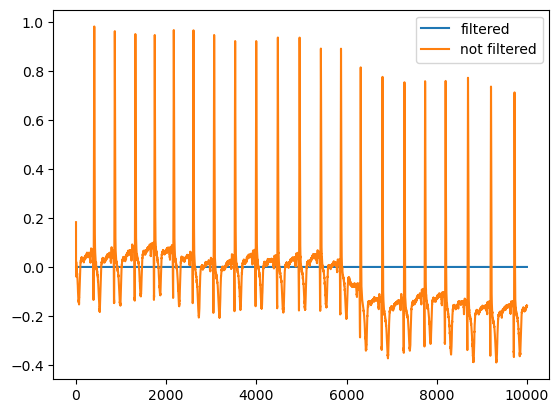

In [23]:
import matplotlib.pyplot as plt 
plt.plot(x_normal[0][:10000, -1], label = "filtered")
plt.plot(x_normal_nf[0][:10000, -1], label = "not filtered")
plt.legend()

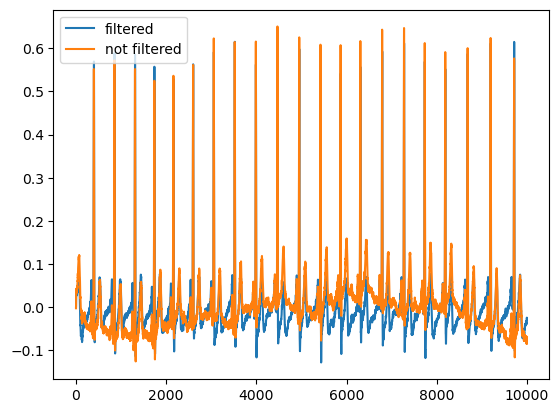

In [24]:
import matplotlib.pyplot as plt 
plt.plot(x_normal[0][:10000, 0], label = "filtered")
plt.plot(x_normal_nf[0][:10000, 0], label = "not filtered")
plt.legend()

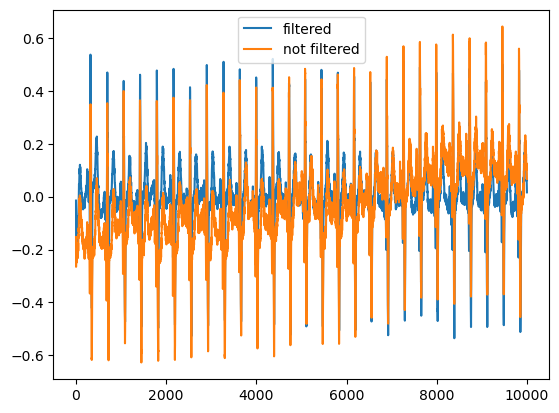

In [25]:
plt.plot(x_ab[0][:10000, 0], label = "filtered")
plt.plot(x_ab_nf[0][:10000, 0], label = "not filtered")
plt.legend()

In [26]:
from sklearn.model_selection import train_test_split

#x_train, x_testn, y_train, y_test_n = train_test_split(x_normal, y_normal, test_size = 0.2)
#x_train.shape, x_testn.shape, y_train.shape, y_test_n.shape

In [27]:
#torch.save(x_train, "x_train.pt")
#torch.save(x_testn, "x_testn.pt")
#torch.save(y_train, "y_train.pt")
#torch.save(y_test_n, "y_test_n.pt")

In [28]:
x_train = torch.load("x_train.pt")
x_testn = torch.load("x_testn.pt")
y_train = torch.load("y_train.pt")
y_test_n = torch.load("y_test_n.pt")

In [29]:
"""
bool = True
for i, x in enumerate(x_train):
    temp_x = temp[i]
    for ch in range(15):
        temp_x_ch = temp_x[:, ch]
        x_ch = x[:, ch]
        if not (x_ch == temp_x_ch).all():
            bool = False
            break
bool
"""

'\nbool = True\nfor i, x in enumerate(x_train):\n    temp_x = temp[i]\n    for ch in range(15):\n        temp_x_ch = temp_x[:, ch]\n        x_ch = x[:, ch]\n        if not (x_ch == temp_x_ch).all():\n            bool = False\n            break\nbool\n'

In [30]:
from sklearn.metrics import roc_curve, auc 

def plot_roc_curve(y, y_pred):
    # calculate the fpr, tpr, AUC and plot the ROC curve 
    '''
    input: 
    y: array-like contenente i valori dell'attributo target
    y_pred: array-like contenente le predizioni dell'attributo target
    output: None
    
    '''
    y = np.array(y)       #cast array-like in numpy array
    y_pred = np.array(y_pred)
    labels = np.unique(y)
    fpr, tpr, threshold = roc_curve(y, y_pred)
    #print(fpr, tpr)
    roc_auc = round(auc(fpr, tpr), 4)
    
    plt.title('ROC curve')
    plt.plot(fpr, tpr, 'b', label = 'AUC {}'.format(roc_auc))
    plt.legend(loc = 'lower right')
    plt.plot(labels, labels,'r--')
    plt.xlim([-0.05, 1])
    plt.ylim([0, 1.05])
    plt.ylabel('True Positive Rate')
    plt.xlabel('False Positive Rate')
    plt.show()

In [31]:
def plot_cm(cm):
    
    import matplotlib.pyplot as plt
    import seaborn as sns
    import pandas as pd
    import numpy as np

    sns.set(style='white')
    fig, ax = plt.subplots(figsize=(12, 8))
    sns.heatmap(np.eye(2), annot=cm, fmt='g', annot_kws={'size': 50},
                cmap=sns.color_palette(['tomato', 'palegreen'], as_cmap=True), cbar=False,
                yticklabels=['Normal', 'Abnormal'], xticklabels=['Normal', 'Abnormal'], ax=ax)
    ax.xaxis.tick_top()
    ax.xaxis.set_label_position('top')
    ax.tick_params(labelsize=20, length=0)

    ax.set_title('Seaborn Confusion Matrix with labels', size=24, pad=20)
    ax.set_xlabel('Predicted Values', size=20)
    ax.set_ylabel('Actual Values', size=20)

    additional_texts = ['(True Positive)', '(False Negative)', '(False Positive)', '(True Negative)']
    for text_elt, additional_text in zip(ax.texts, additional_texts):
        ax.text(*text_elt.get_position(), '\n' + additional_text, color=text_elt.get_color(),
                ha='center', va='top', size=24)
    plt.tight_layout()
    plt.show()

In [32]:
from sklearn.metrics import confusion_matrix, roc_auc_score, classification_report

def validate_model(y_trues, y_preds):

    TP = 0
    FP = 0
    TN = 0
    FN = 0
    idxs_missclassified = []

    for i, y_true in enumerate(y_trues):

        y_pred = y_preds[i]

        if y_true == 1: #"N":
            if y_pred == y_true:
                TN += 1
            else:
                FP += 1
                idxs_missclassified.append(i)

        else:
            if y_pred == y_true:
                TP += 1 
            else:
                FN += 1
            idxs_missclassified.append(i)
    
    TP, FN, FP, TN = confusion_matrix(y_trues, y_preds).ravel() 
            
    acc = (TP+TN)/(TP+TN+FP+FN)
    if FN + TP != 0:
        TPR = TP/(FN+TP) #sensitivity 
        FNR = FN/(FN+TP)
        recall = TPR
    else: 
        TPR = None
        FNR = None 
        recall = None
    
    if TN+FP != 0:
        
        TNR = TN/(TN+FP) #specificity
        FPR = FP/(TN+FP)
    else: 
        TNR = None
        FPR = None 
    
    if TP+FP != 0:
        precision = TP/(TP+FP)
    else:
        precision = None
    
    if precision != 0 and recall != 0:
        f1 = (2*precision*recall)/(precision+recall)
    else:
        f1 = None 
    
    cr = classification_report(y_trues, y_preds)
    cm = confusion_matrix(y_trues, y_preds)
    auc = roc_auc_score(y_trues, y_preds)
    metrics = {
        "accuracy": acc,
        "f1": f1,
        "cm": cm,
        "sensitivity": TPR,
        "specificity": TNR,
        "missed allarm rate": FPR,
        "false allarm rate": FNR,
        "auc_score": auc,
        "precision": precision,
        "recall": recall,
        "report": cr,
        "predictions": y_preds,
        "idxs_missclassified": idxs_missclassified
    }
    plot_roc_curve(y_trues, y_preds)
    plot_cm(cm)
    return metrics, "Accuracy: {} \n F1 score: {} \n Sensitivity: {} \n Specificity: {} \n ROC AUC score: {} \n False Allarm Rate: {}, Missed Allarm Rate: {} \n Confusion Matrix: \n {} \n Classification Report: \n {} \n".format(acc, f1, TPR, TNR, auc, FNR, FPR, cm, cr)

In [33]:
from EcgStuffs.src.windows.WindowingUtils import sliding_window
from IPython.display import clear_output

In [34]:
map_signals

{0: 'patient001/s0010_re.dat',
 1: 'patient001/s0014lre.dat',
 2: 'patient001/s0016lre.dat',
 3: 'patient002/s0015lre.dat',
 4: 'patient003/s0017lre.dat',
 5: 'patient004/s0020are.dat',
 6: 'patient004/s0020bre.dat',
 7: 'patient005/s0021are.dat',
 8: 'patient005/s0021bre.dat',
 9: 'patient005/s0025lre.dat',
 10: 'patient005/s0031lre.dat',
 11: 'patient005/s0101lre.dat',
 12: 'patient006/s0022lre.dat',
 13: 'patient006/s0027lre.dat',
 14: 'patient006/s0064lre.dat',
 15: 'patient007/s0026lre.dat',
 16: 'patient007/s0029lre.dat',
 17: 'patient007/s0038lre.dat',
 18: 'patient007/s0078lre.dat',
 19: 'patient008/s0028lre.dat',
 20: 'patient008/s0037lre.dat',
 21: 'patient008/s0068lre.dat',
 22: 'patient009/s0035_re.dat',
 23: 'patient010/s0036lre.dat',
 24: 'patient010/s0042lre.dat',
 25: 'patient010/s0061lre.dat',
 26: 'patient011/s0039lre.dat',
 27: 'patient011/s0044lre.dat',
 28: 'patient011/s0049lre.dat',
 29: 'patient011/s0067lre.dat',
 30: 'patient012/s0043lre.dat',
 31: 'patient012/s

In [35]:
index_testn = []
for x in x_testn:
    for i, signal in enumerate(all_signals):
        if np.array_equal(x, signal):
            index_testn.append(i)
            break
index_testn

[450,
 453,
 449,
 462,
 465,
 486,
 357,
 448,
 343,
 456,
 500,
 461,
 508,
 391,
 442,
 507]

In [36]:
index_trainn = []
for x in x_train:
    for i, signal in enumerate(all_signals):
        if np.array_equal(x, signal):
            index_trainn.append(i)
            break
index_trainn

[452,
 376,
 469,
 383,
 362,
 451,
 454,
 498,
 361,
 483,
 446,
 334,
 499,
 380,
 475,
 441,
 501,
 388,
 503,
 478,
 467,
 458,
 392,
 425,
 381,
 407,
 466,
 457,
 509,
 335,
 375,
 474,
 468,
 447,
 473,
 369,
 389,
 386,
 464,
 316,
 459,
 472,
 370,
 460,
 502,
 390,
 331,
 490,
 487,
 387,
 382,
 463,
 317,
 329,
 455,
 379,
 330,
 377,
 395,
 393,
 371,
 396,
 489,
 406]

In [37]:
index_testab = []
for x in x_ab:
    for i, signal in enumerate(all_signals):
        if np.array_equal(x, signal):
            index_testab.append(i)
            break
index_testab

[0,
 1,
 2,
 3,
 4,
 5,
 6,
 7,
 8,
 9,
 10,
 11,
 12,
 13,
 14,
 15,
 16,
 17,
 18,
 19,
 20,
 21,
 22,
 23,
 24,
 25,
 26,
 27,
 28,
 29,
 30,
 31,
 32,
 33,
 34,
 35,
 36,
 37,
 38,
 39,
 40,
 41,
 42,
 43,
 44,
 45,
 46,
 47,
 48,
 49,
 50,
 51,
 52,
 53,
 54,
 55,
 56,
 57,
 58,
 59,
 60,
 61,
 62,
 63,
 64,
 65,
 66,
 67,
 68,
 69,
 70,
 71,
 72,
 73,
 74,
 75,
 76,
 77,
 78,
 79,
 80,
 81,
 82,
 83,
 84,
 85,
 86,
 87,
 88,
 89,
 90,
 91,
 92,
 93,
 94,
 95,
 96,
 97,
 98,
 99,
 100,
 101,
 102,
 103,
 104,
 105,
 106,
 107,
 108,
 109,
 110,
 111,
 112,
 113,
 114,
 115,
 116,
 117,
 118,
 119,
 120,
 121,
 122,
 123,
 124,
 125,
 126,
 127,
 128,
 129,
 130,
 131,
 132,
 133,
 134,
 135,
 136,
 137,
 138,
 139,
 140,
 141,
 142,
 143,
 144,
 145,
 146,
 147,
 148,
 149,
 150,
 151,
 152,
 153,
 154,
 155,
 156,
 157,
 158,
 159,
 160,
 161,
 162,
 163,
 164,
 165,
 166,
 167,
 168,
 169,
 170,
 171,
 172,
 173,
 174,
 175,
 176,
 177,
 178,
 179,
 180,
 181,
 182,
 183,
 184,


In [38]:
windows_uq = {uq: {"y_test": [], "windows": []} for uq in uqs if uq != "Healthy control"}
windows_uq

{'Bundle branch block': {'y_test': [], 'windows': []},
 'Cardiomyopathy': {'y_test': [], 'windows': []},
 'Dysrhythmia': {'y_test': [], 'windows': []},
 'Heart failure (NYHA 2)': {'y_test': [], 'windows': []},
 'Heart failure (NYHA 3)': {'y_test': [], 'windows': []},
 'Heart failure (NYHA 4)': {'y_test': [], 'windows': []},
 'Hypertrophy': {'y_test': [], 'windows': []},
 'Myocardial infarction': {'y_test': [], 'windows': []},
 'Myocarditis': {'y_test': [], 'windows': []},
 'Palpitation': {'y_test': [], 'windows': []},
 'Stable angina': {'y_test': [], 'windows': []},
 'Unstable angina': {'y_test': [], 'windows': []},
 'Valvular heart disease': {'y_test': [], 'windows': []}}

In [39]:
#map windows 
windows_train = []
windows_normal = []
map_windows = {}
y_all_patient = {}
k = 0

for i, signal in enumerate(x_train):
    print("Train", i+1, "/", len(x_train), end="\r")
    signal = signal.T
    patient = map_signals[index_trainn[i]]
    y_all_patient[patient] = 0
    map_windows[patient] = []
    windows = sliding_window(signal[:, 3000:], 2000, 1500) 
    for window in windows:
        windows_train.append(window)
        windows_normal.append(window)
        map_windows[patient].append(k)
        k+=1
        
clear_output()
windows_test = []
y_test = []
y_test_patient = {}
map_windows_test = {}
j = 0
for i, signal in enumerate(x_testn):
    patient = map_signals[index_testn[i]]
    map_windows_test[patient] = []
    map_windows[patient] = []
    print("Test", i+1, "/", len(x_testn), end="\r")
    signal = signal.T
    y_test_patient[patient] = 0
    y_all_patient[patient] = 0
    p = patient.split("/")[0]
    r = patient.split("/")[1]
    windows = sliding_window(signal[:, 3000:], 2000, 1500)
    for window in windows:
        windows_test.append(window)
        windows_normal.append(window)
        y_test.append(0)
        map_windows_test[patient].append(j)
        map_windows[patient].append(k)
        for uq in uqs:
            if uq != "Healthy control":
                windows_uq[uq]["windows"].append(window)
                windows_uq[uq]["y_test"].append(0)
        j+=1
        k+=1
        
for i, signal in enumerate(x_ab):
    print("Test", i+1, "/", len(x_ab), end="\r")
    patient = map_signals[index_testab[i]]
    map_windows_test[patient] = []
    map_windows[patient] = []
    y_all_patient[patient] = 1
    signal = signal.T
    y_test_patient[patient] = 1
    p = patient.split("/")[0]
    r = patient.split("/")[1]
    y_real = y_patients[p][r]
    windows = sliding_window(signal[:, 3000:], 2000, 1500)
    for window in windows:
        windows_test.append(window)
        y_test.append(1)
        map_windows_test[patient].append(j)
        map_windows[patient].append(k)
        windows_uq[y_real]["windows"].append(window)
        windows_uq[y_real]["y_test"].append(1)
        j+=1
        k+=1

In [41]:
device = "cuda" if torch.cuda.is_available else "cpu"

for key, windows_labels in windows_uq.items():
    labels = windows_labels["y_test"]
    windows = windows_labels["windows"]
    n = len(windows)
    temp = torch.zeros((n, 15, 2000))
    for i, window in enumerate(windows):
        temp[i] = torch.from_numpy(window)
    windows_uq[key]["y_test"] = torch.FloatTensor(labels).to(device)
    windows_uq[key]["windows"] = temp

In [42]:
for key, windows_labels in windows_uq.items():
    labels = windows_labels["y_test"]
    windows = windows_labels["windows"]
    print(key, labels.shape, windows.shape)

Bundle branch block torch.Size([1212]) torch.Size([1212, 15, 2000])
Cardiomyopathy torch.Size([1192]) torch.Size([1192, 15, 2000])
Dysrhythmia torch.Size([998]) torch.Size([998, 15, 2000])
Heart failure (NYHA 2) torch.Size([615]) torch.Size([615, 15, 2000])
Heart failure (NYHA 3) torch.Size([615]) torch.Size([615, 15, 2000])
Heart failure (NYHA 4) torch.Size([615]) torch.Size([615, 15, 2000])
Hypertrophy torch.Size([870]) torch.Size([870, 15, 2000])
Myocardial infarction torch.Size([13768]) torch.Size([13768, 15, 2000])
Myocarditis torch.Size([757]) torch.Size([757, 15, 2000])
Palpitation torch.Size([615]) torch.Size([615, 15, 2000])
Stable angina torch.Size([652]) torch.Size([652, 15, 2000])
Unstable angina torch.Size([615]) torch.Size([615, 15, 2000])
Valvular heart disease torch.Size([718]) torch.Size([718, 15, 2000])


In [43]:
windows_train[0].shape

(15, 2000)

In [44]:
len(windows_train), len(windows_test)

(2398, 15982)

In [45]:
len(windows_train) + len(windows_test)

18380

In [46]:
all_windows = []
all_y = []

for window in windows_train:
    all_windows.append(window)
    all_y.append(0)

for i, window in enumerate(windows_test):
    y = y_test[i]
    all_windows.append(window)
    all_y.append(y)

In [47]:
len(all_windows), len(all_y)

(18380, 18380)

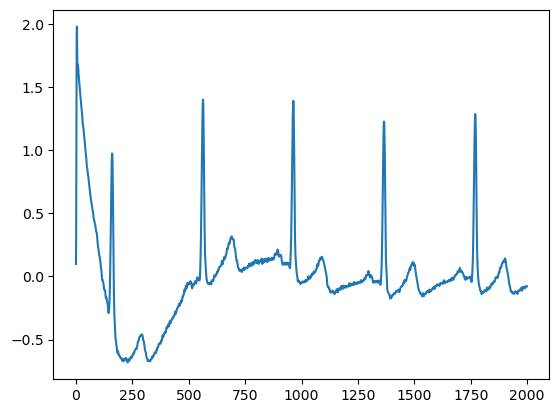

In [48]:
plt.plot(signal[0, :2000])

In [49]:
len(windows_train)

2398

In [50]:
#y_test_patient

In [51]:
#map_windows

In [52]:
len(y_test)

15982

In [53]:
len(windows_train), len(windows_test)

(2398, 15982)

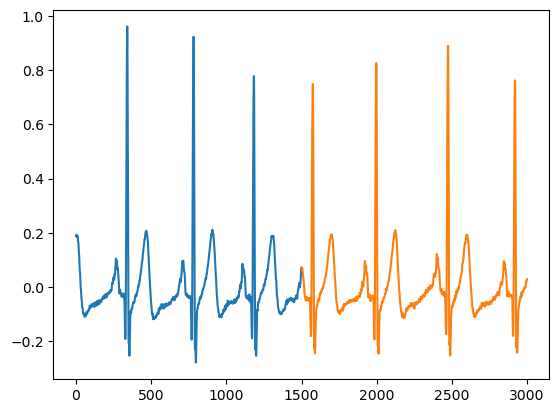

In [54]:
plt.plot(np.arange(0, 1500), windows_train[0][0, :1500])
plt.plot(np.arange(1500, 3000), windows_train[1][0, :1500])

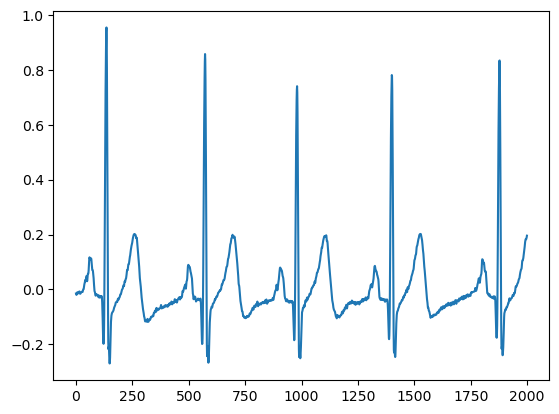

In [55]:
plt.plot(windows_train[7][0, :])

In [56]:
windows_train[0].shape

(15, 2000)

In [57]:
n = len(windows_train)
temp = torch.zeros((n, 15, 2000))
for i, window in enumerate(windows_train):
    temp[i] = torch.from_numpy(window)
windows_train = temp
windows_train.shape

torch.Size([2398, 15, 2000])

In [58]:
n = len(windows_test)
temp = torch.zeros((n, 15, 2000))
for i, window in enumerate(windows_test):
    temp[i] = torch.from_numpy(window)
windows_test = temp
windows_test.shape

torch.Size([15982, 15, 2000])

In [59]:
n = len(all_windows)
temp = torch.zeros((n, 15, 2000))
for i, window in enumerate(all_windows):
    print(i+1, "/", n, end="\r")
    temp[i] = torch.from_numpy(window)
all_windows = temp
all_windows.shape

torch.Size([18380, 15, 2000])

In [60]:
n = len(windows_normal)
temp = torch.zeros((n, 15, 2000))
for i, window in enumerate(windows_normal):
    print(i+1, "/", n, end="\r")
    temp[i] = torch.from_numpy(window)
windows_normal = temp
windows_normal.shape

torch.Size([3003, 15, 2000])

In [61]:
device = "cuda" if torch.cuda.is_available else "cpu"
device

'cuda'

In [62]:
class ECGDataset():
  
    def __init__(self, data):
        self.data = data

    def __len__(self):
        return len(self.data)
    
    def __getitem__(self, index):
        sample = self.data[index]
        return sample

In [63]:
windows_train = torch.unsqueeze(windows_train, dim = 1).to(device)
windows_train.shape

torch.Size([2398, 1, 15, 2000])

In [64]:
windows_normal = torch.unsqueeze(windows_normal, dim=1).to(device)
windows_normal.shape

torch.Size([3003, 1, 15, 2000])

In [65]:
#train_dataset = ECGDataset(windows_train)
train_dataset = ECGDataset(windows_normal)

In [66]:
import collections

from pytorch_lightning.loggers import Logger 
from pytorch_lightning.loggers.logger import rank_zero_experiment
from pytorch_lightning.utilities import rank_zero_only

class HistoryLogger(Logger):
    def __init__(self):
        super().__init__()

        self.history = collections.defaultdict(list) # copy not necessary here
        self.log = collections.defaultdict(list) 
        self.loss = collections.defaultdict(list) 
        self.epoch = 1
        self.metric_names = []
        # The defaultdict in contrast will simply create any items that you try to access

    @property
    def name(self):
        return "Logger"

    @property
    def version(self):
        return "1.0"

    @property
    @rank_zero_experiment
    def experiment(self):
        pass

    @rank_zero_only
    def log_metrics(self, metrics, step):
        
        for metric_name, metric_value in metrics.items():
            if metric_name != 'epoch':
                if metric_name not in self.metric_names:
                    self.metric_names.append(metric_name)
                self.history["temp"+metric_name].append(metric_value)
            
    def log_end_epoch(self): 

        for metric_name in self.metric_names:
            epoch_metric_values = self.history["temp"+metric_name]
            mean_metric = np.mean(epoch_metric_values)
            self.log[metric_name].append(mean_metric)
            self.loss[self.epoch] = epoch_metric_values
            self.epoch += 1
    
    def log_hyperparams(self, params):
        pass

In [67]:
from pytorch_lightning import LightningModule

class ECGADLightning(LightningModule):
    
    def __init__(self, model, lr):
        super().__init__()
        self.model = model
        self.lr = lr
        self.metric = torch.nn.MSELoss()
        self.optimizer = torch.optim.Adam(self.parameters(), lr=self.lr)
    def forward(self, x):
        return self.model(x)
    
    def configure_optimizers(self):
        return self.optimizer 
    
    def training_step(self, batch, batch_idx):
        x = batch
        x_hat = self.model(x)
        loss = self.metric(x, x_hat)
        self.log_dict({"loss": loss}, sync_dist=True)
        return loss

    def validation_step(self, batch, batch_idx):
        self._shared_eval(batch, batch_idx, "val")

    def test_step(self, batch, batch_idx):
        self._shared_eval(batch, batch_idx, "test")

    def _shared_eval(self, batch, batch_idx, prefix):
        x = batch
        x_hat = self.model(x)
        loss = self.metric(x, x_hat)
        self.log(f"{prefix}_loss", loss)
        
    def on_train_epoch_end(self):
        
        self.logger.log_end_epoch() 

In [68]:
train_dataloader = torch.utils.data.DataLoader(train_dataset, 
                                               batch_size = 4,#1
                                               shuffle = True
                                              )

In [69]:
device

'cuda'

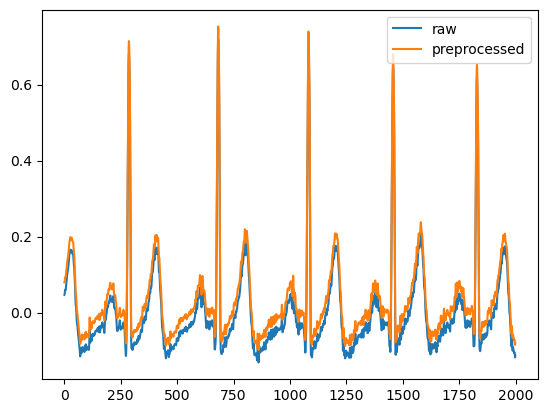

In [70]:
patient = "patient251/s0486_re.dat"
w = map_windows[patient]
windows = all_windows[w]
window = windows[0]
baselinezero_window = remove_baselineshift_window(window)
plt.plot(window[0, :], label = "raw")
plt.plot(baselinezero_window[0, :], label = "preprocessed")
plt.legend()

In [71]:
"""
from pytorch_lightning.trainer import Trainer
if torch.cuda.is_available():
    model = dpnet_loader.load() #load auto encoder model
    model = model.to(device)
else:
    model = dpnet_loader.load_cpu()
 
epochs = 3000
logger = HistoryLogger()
lightningmodel = ECGADLightning(model, lr = 0.0001)#0.00001
trainer = Trainer(accelerator='gpu', precision=16, max_epochs = epochs, logger= logger, log_every_n_steps = 1, default_root_dir="lightning_logs/")#100
trainer.fit(lightningmodel, train_dataloader)
"""

'\nfrom pytorch_lightning.trainer import Trainer\nif torch.cuda.is_available():\n    model = dpnet_loader.load() #load auto encoder model\n    model = model.to(device)\nelse:\n    model = dpnet_loader.load_cpu()\n \nepochs = 3000\nlogger = HistoryLogger()\nlightningmodel = ECGADLightning(model, lr = 0.0001)#0.00001\ntrainer = Trainer(accelerator=\'gpu\', precision=16, max_epochs = epochs, logger= logger, log_every_n_steps = 1, default_root_dir="lightning_logs/")#100\ntrainer.fit(lightningmodel, train_dataloader)\n'

In [72]:
import gc

In [73]:
def plot_latent_space(model, datas, labels):
    
    from sklearn.decomposition import PCA 
    from sklearn.manifold import TSNE
    import plotly.graph_objects as go 
    
    map_labels = {0: "Normal", 1: "Abnormal"}
    fig = go.FigureWidget() 

    labels = np.array(labels)
    colors = ["red", "green"]
    uq_labels = np.unique(labels)[::-1]
    for j, label in enumerate(uq_labels):
        
        torch.cuda.empty_cache()
        gc.collect()
        color = colors[j]
        labels_n = []
        first_component = []
        second_component = []
        idx_label = np.argwhere(labels == label)
        data_label = datas[idx_label]
        data_label = data_label.to("cpu")
        data_label = torch.squeeze(data_label, dim = 1)
        #print(data_label.shape)
        latent_space = model.encoder(data_label)  
        trnsf = PCA(n_components=2)
        print(latent_space.cpu().detach().numpy().shape)
        components = trnsf.fit_transform(latent_space.cpu().detach().numpy())
        print(components.shape)
        first_component = components[:, 0]
        second_component = components[:, 1]
        #third_component = components[:, 2]
        labels_n.append(label)
        #fig.add_trace(go.Scatter3d(x = first_component, y = second_component, z = third_component, mode  = "markers", marker_color = color, legendgroup = map_labels[label.item()]))
        fig.add_trace(go.Scatter(x = first_component, y = second_component, mode  = "markers", marker_color = color, name = map_labels[label.item()], legendgroup = map_labels[label.item()]))
        
    #fig.update_layout(xaxis_title = "First component", yaxis_title = "Second component", zaxis_title = "Third component")
    return fig 

In [155]:
fig = plot_latent_space(model.to("cpu"), windows_test, y_test)
fig.show()

RuntimeError: Given groups=1, weight of size [15, 1, 7, 7], expected input[1, 15377, 15, 2000] to have 1 channels, but got 15377 channels instead

In [69]:
model = model.to(device)

In [203]:
#torch.save(model.state_dict(), "model_1407.pt")

In [75]:
if torch.cuda.is_available():
    model = dpnet_loader.load() #load auto encoder model
else:
    model =  dpnet_loader.load_cpu()
model.load_state_dict(torch.load("model.pt"))
model = model.to(device)

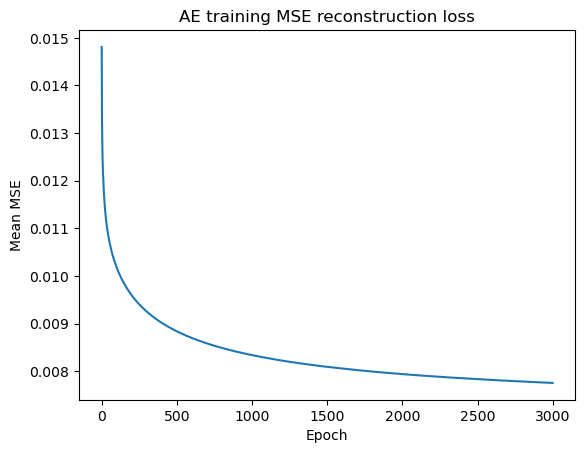

In [76]:
#losses = logger.log["loss"]
epochs = 3000
losses = torch.load("losses_training.pt")
fig = plt.Figure(figsize=(20, 10))
plt.title("AE training MSE reconstruction loss")
epochs_plot = np.arange(0, epochs, 1)
plt.plot(epochs_plot, losses)
plt.xlabel("Epoch")
plt.ylabel("Mean MSE")
plt.savefig("loss.png")

In [73]:
losses

[0.014809485531093357,
 0.013832836160461074,
 0.013310921416877113,
 0.012984476050364471,
 0.012764748538684314,
 0.012557620397379107,
 0.012419380240063687,
 0.01228236767192732,
 0.012173794350916287,
 0.012101180075832734,
 0.012082113563200922,
 0.01199015524662879,
 0.01191679732443813,
 0.01184516172711354,
 0.011780577377303343,
 0.011722429353370518,
 0.011669566508625037,
 0.011618609636514125,
 0.011572778297915748,
 0.011530423382130983,
 0.011484704935713817,
 0.011444703023565055,
 0.01140722577597978,
 0.01137024497254609,
 0.011334765413689232,
 0.01130271799697641,
 0.011270749908136838,
 0.011239101384470191,
 0.011210269253178244,
 0.011183174019964652,
 0.011154089349950757,
 0.011126984975162147,
 0.011099772693594065,
 0.011075725581705147,
 0.011051947349958463,
 0.011028313493423075,
 0.011005386376594112,
 0.01098467765567993,
 0.010963015192673842,
 0.010942144260114585,
 0.010921598572259725,
 0.010898869660441214,
 0.01087929328825083,
 0.01086237491744738

In [75]:
#torch.save(losses, "losses_training.pt")

In [76]:
model.eval()

DPNet(
  (encoder): Encoder(
    (conv_0): Conv2d(1, 15, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
    (activation0): Tanh()
    (conv_1): Conv2d(15, 30, kernel_size=(5, 5), stride=(2, 2), padding=(2, 2), bias=False)
    (activation1): Tanh()
    (block_0): EncoderBlock(
      (conv2d_in): Conv2d(30, 30, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (activation_in): Tanh()
      (batch_norm_in): BatchNorm2d(30, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (dropout_in): Dropout(p=0.2, inplace=False)
      (conv2d_out): Conv2d(30, 45, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), bias=False)
      (skip_con): Sequential(
        (0): Conv2d(30, 45, kernel_size=(1, 1), stride=(2, 2), bias=False)
        (1): BatchNorm2d(45, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      )
      (batch_norm_out): BatchNorm2d(45, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (activation_o

In [ ]:
windows_test.shape

In [ ]:
windows_test = torch.unsqueeze(windows_test, dim=1)
windows_test.shape

In [165]:
model = model.to(device)

In [166]:
"""
if torch.cuda.is_available():
    model = dpnet_loader.load() #load auto encoder model
    model = model.to(device)
else:
    model = dpnet_loader.load_cpu()
"""

from torch.functional import F 

fs = 500 
nchs = 15 
interval2 = 1500
interval = 2000
reconstruction_errors = []
n = windows_test.shape[0]
for i, batch_data in enumerate(windows_test): 
    
    batch_data = batch_data.to(device)
    #print(batch_data.shape)
    batch_data = torch.unsqueeze(batch_data, dim = 0).to(device)
    batch_data = torch.unsqueeze(batch_data, dim = 0)
    #print(batch_data.shape)
    reconstruction_all = np.zeros((nchs, interval2))        

    with torch.no_grad():

        reconstruction = model(batch_data)
        reconstruction_error = F.mse_loss(reconstruction[0, 0, :, :interval2], batch_data[0, 0, :, :interval2]).item()
        print(i+1, "/", n, "Recon error:", round(reconstruction_error, 6), end = "\r")
        reconstruction_errors.append(reconstruction_error)
        recon_np = (reconstruction[0, 0, :, :interval2].cpu().detach().numpy()).reshape(1, nchs, interval2)
        reconstruction_all[:, :] = recon_np[0, :, :interval2]

        torch.cuda.empty_cache()

In [167]:
len(reconstruction_errors)

15982

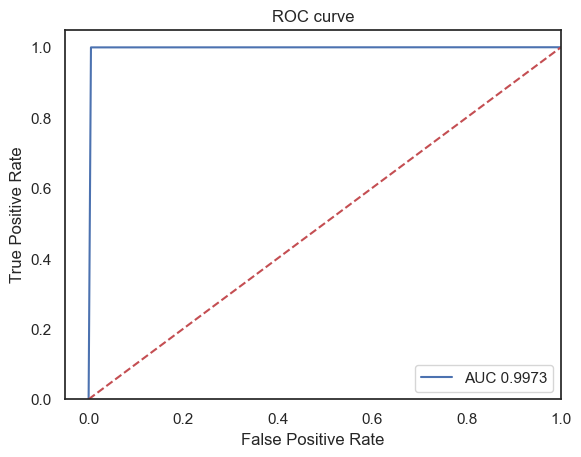

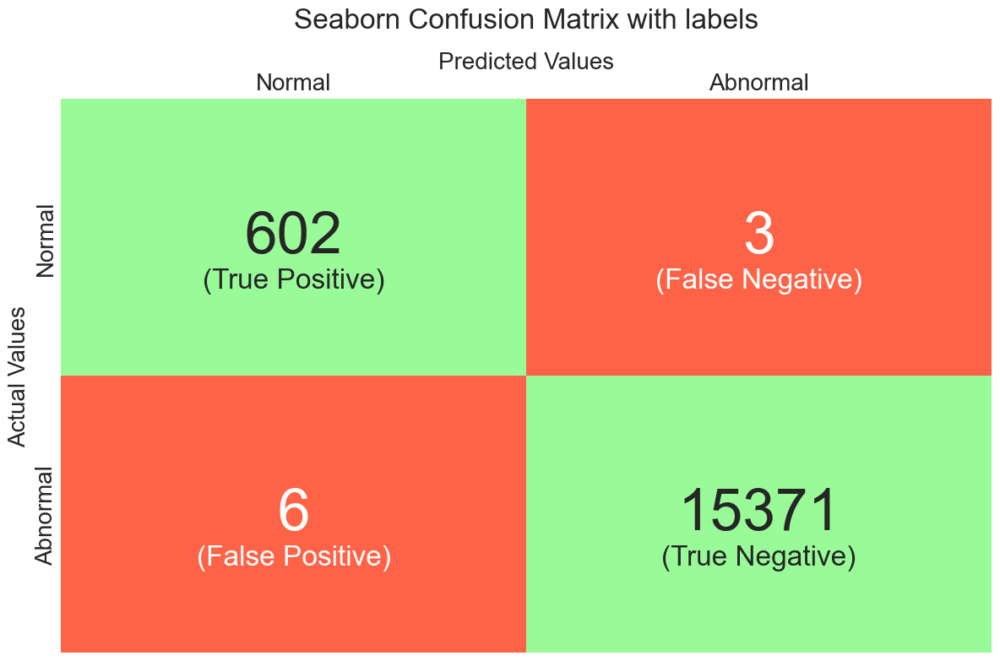

In [168]:
from time import sleep
best_th = 0.0
best_auc = 0.0
normal_mse = []
anomalous_mse = []
count_decr = 0 
fprs = [0]
tprs = [0]
thresholds = np.arange(0.0001, 0.1, 0.00005)
for j, threshold in enumerate(thresholds):
    print(threshold)
    y_preds = []
    for i, recon_error in enumerate(reconstruction_errors):

        if j == 0:
            if y_test[i] == 0:
                normal_mse.append(recon_error)
            else:
                anomalous_mse.append(recon_error)

        if recon_error > threshold:
            y_preds.append(1)
        else:
            y_preds.append(0)
                
        y = y_test[i]
        
    sleep(0.5)
    clear_output(wait = True)
    metrics, to_print = validate_model(y_test, y_preds)
    auc_score = metrics["auc_score"]
    if auc_score > best_auc:
        best_th = threshold
        best_auc = auc_score
    if auc_score < best_auc:
        count_decr += 1
    if count_decr >= 10: 
        break
    fpr, tpr, _ = roc_curve(y_test, y_preds)
    fprs.append(fpr[1])
    tprs.append(tpr[1])
    print(to_print)
fprs.append(1)
tprs.append(1)

In [169]:
best_th, best_auc

(0.0026000000000000003, 0.9974556289660903)

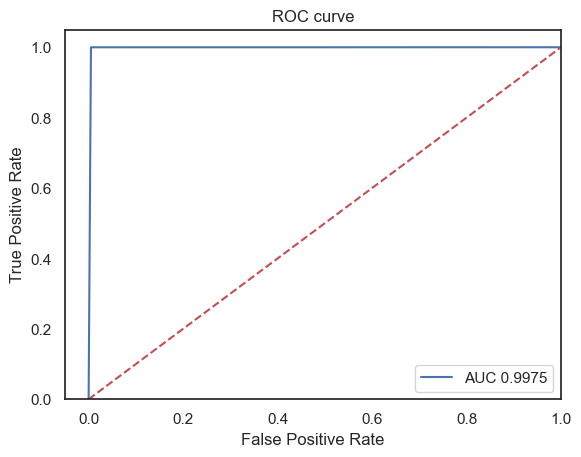

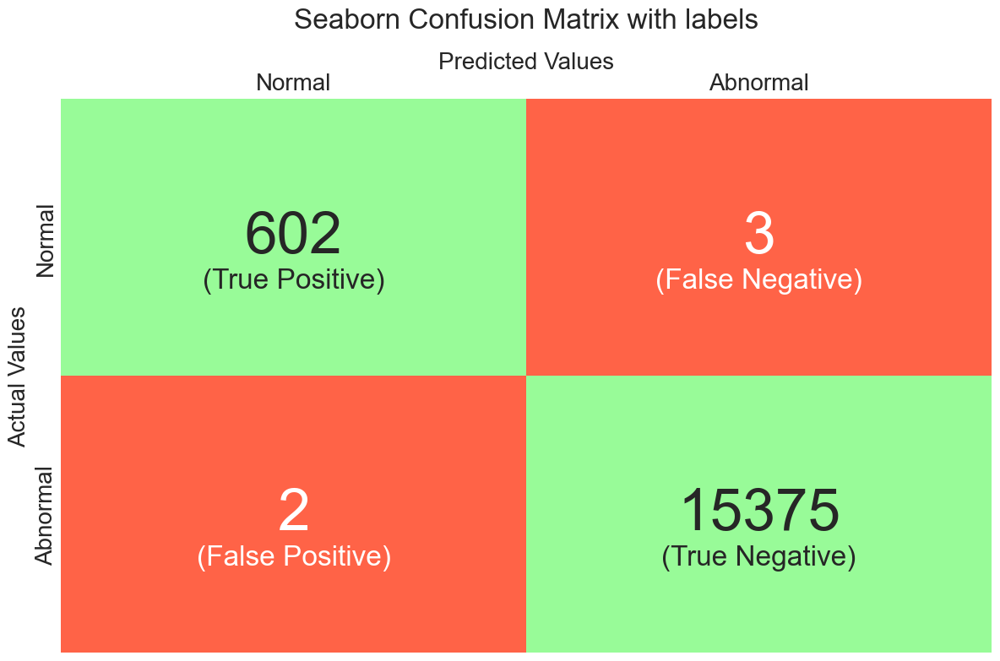

Accuracy: 0.9996871480415468 
 F1 score: 0.9958643507030605 
 Sensitivity: 0.9950413223140496 
 Specificity: 0.999869935618131 
 ROC AUC score: 0.9974556289660903 
 False Allarm Rate: 0.0049586776859504135, Missed Allarm Rate: 0.00013006438186902516 
 Confusion Matrix: 
 [[  602     3]
 [    2 15375]] 
 Classification Report: 
               precision    recall  f1-score   support

           0       1.00      1.00      1.00       605
           1       1.00      1.00      1.00     15377

    accuracy                           1.00     15982
   macro avg       1.00      1.00      1.00     15982
weighted avg       1.00      1.00      1.00     15982
 



In [171]:
y_preds = []
for i, recon_error in enumerate(reconstruction_errors):
    
    if recon_error > best_th:
        y_preds.append(1)
    else:
        y_preds.append(0)
                
    y = y_test[i]
        
metrics, to_print = validate_model(y_test, y_preds)
auc_score = metrics["auc_score"]
print(to_print)

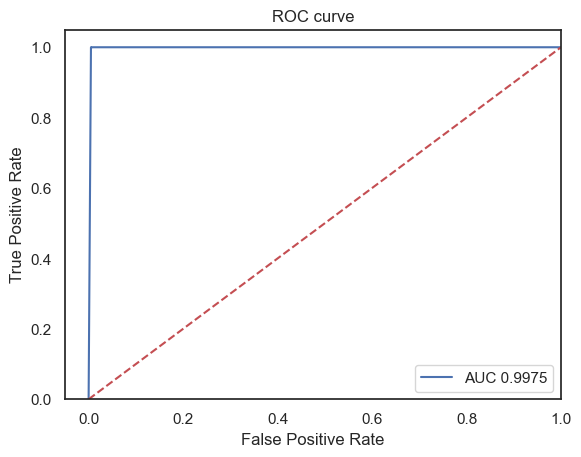

In [172]:
roc_auc = round(auc(sorted(fprs), sorted(tprs)), 4)
plt.title('ROC curve')
plt.plot(sorted(fprs), sorted(tprs), 'b', label = 'AUC {}'.format(roc_auc))
plt.legend(loc = 'lower right')
plt.plot(labels, labels,'r--')
plt.xlim([-0.05, 1])
plt.ylim([0, 1.05])
plt.ylabel('True Positive Rate')
plt.xlabel('False Positive Rate')
plt.show()

In [173]:
np.savetxt("fprs.txt", np.array(sorted(fprs)))
np.savetxt("tprs.txt", np.array(sorted(tprs)))

E:\Users\Utente\anaconda3\lib\site-packages\paramiko\transport.py:219: CryptographyDeprecationWarning: Blowfish has been deprecated
  "class": algorithms.Blowfish,


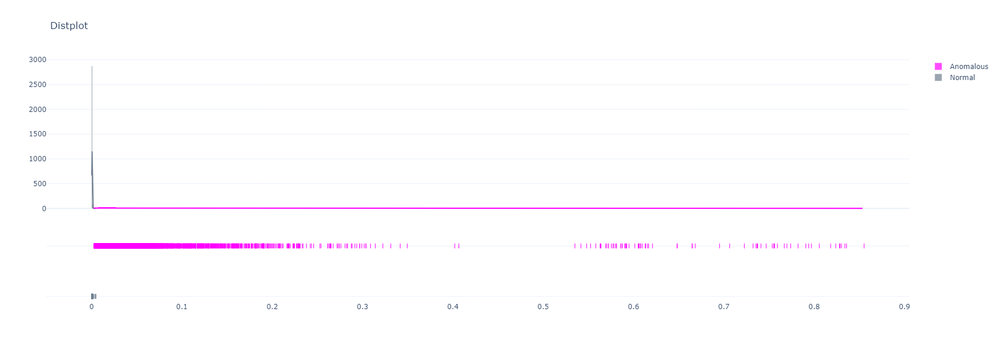

In [102]:
import plotly.figure_factory as ff
import numpy as np


group_labels = ['Normal', 'Anomalous']

colors = ['slategray', 'magenta']

# Create distplot with curve_type set to 'normal'
fig = ff.create_distplot([normal_mse, anomalous_mse], group_labels, bin_size=.0,
                         curve_type='normal', # override default 'kde'
                         colors=colors)
fig.update_layout(title_text='Distplot', template = "plotly_white", height = 600, width = 1200)
fig.show()

In [103]:
channels = ["i", "ii", "iii", "aVR", "aVL", "aVF", "v1", "v2" ,"v3", "v4", "v5", "v6", "x", "y", "z"]

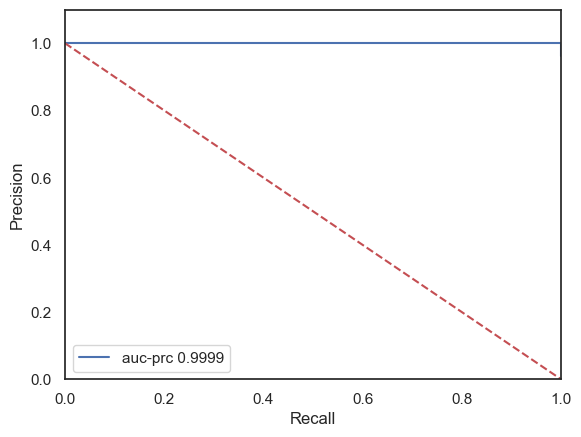

In [87]:
from sklearn.metrics import PrecisionRecallDisplay, precision_recall_curve

prec, recall, _ = precision_recall_curve(y_test, y_preds)
auc_pr = auc(recall, prec)
pr_display = PrecisionRecallDisplay(precision=prec, recall=recall).plot(label="auc-prc {}".format(round(auc_pr, 4)))
plt.plot([0, 1], [1, 0], "--r")
plt.xlim([0, 1])
plt.ylim([0, 1.1])
plt.legend()

In [215]:
def isSignalAnomalous(patient, windows, threshold, test, n_anomalies_th = 1, device = "cuda", verbose = True, model = model):

    reconstruction_errors = []
    reconstruction_windows = torch.zeros_like((windows))
    interval = 1500
    interval2 = 2000
        
    nchs = 15
    n_record = windows.shape[0]*interval
    reconstruction_all = np.zeros((nchs, n_record))
    
    for i, window in enumerate(windows):
        batch_data = torch.unsqueeze(window, dim = 0)
        batch_data = torch.unsqueeze(window, dim = 0)
        batch_data = batch_data.to(device)
        
        if i == 0:
            start = 0
            end = interval
        else:
            start += int(interval)
            end += int(interval) 
        
        #print(i, start, end)
        with torch.no_grad():
            reconstruction = model(batch_data)
            reconstruction_errors.append((F.mse_loss(reconstruction[0, 0, :, :interval], batch_data[0, 0, :, :interval])).item())
            reconstruction_windows[i, :, :] = reconstruction
            torch.cuda.empty_cache()
            if end > n_record:
                reconstruction_all[:, start:n_record] = recon_np[0, :, :interval2-(end-n_record)] #TO FIX START AND END
            else:
                reconstruction_all[:, start:end] = recon_np[0, :, :interval]
                
    predictions = []
    for recon_error in reconstruction_errors:
        if recon_error >= threshold:
            predictions.append(1)
        else:
            predictions.append(0)
            
    uqs, cnts = np.unique(predictions, return_counts = True)
    pred_cnts = {}

    for i, uq in enumerate(uqs):
        cnt = cnts[i]
        pred_cnts[uq] = cnt
    
    pred = 0# Normal
    if 1 in pred_cnts.keys():
        if pred_cnts[1] >= n_anomalies_th:
            pred = 1
    if verbose:
        print("Patient:", patient, "Target:", test,  "Prediction: ", pred, "Windows label:", uqs, "Windows counts:", cnts)
    
    reconstruction_all = torch.from_numpy(reconstruction_all).to(device)
    return reconstruction_all, pred, np.mean(recon_error), predictions

In [123]:
map_y_final = {0: "Normal", 1: "Anomalous"}

Patient: patient008/s0037lre.dat Target: 1 Prediction:  1 Windows label: [1] Windows counts: [37]
0 6000
1500 6000
3000 6000
4500 6000
0 6000
1500 6000
3000 6000
4500 6000
0 6000
1500 6000
3000 6000
4500 6000
0 6000
1500 6000
3000 6000
4500 6000
0 6000
1500 6000
3000 6000
4500 6000
0 6000
1500 6000
3000 6000
4500 6000
0 6000
1500 6000
3000 6000
4500 6000
0 6000
1500 6000
3000 6000
4500 6000
0 6000
1500 6000
3000 6000
4500 6000
0 6000
1500 6000
3000 6000
4500 6000
0 6000
1500 6000
3000 6000
4500 6000
0 6000
1500 6000
3000 6000
4500 6000


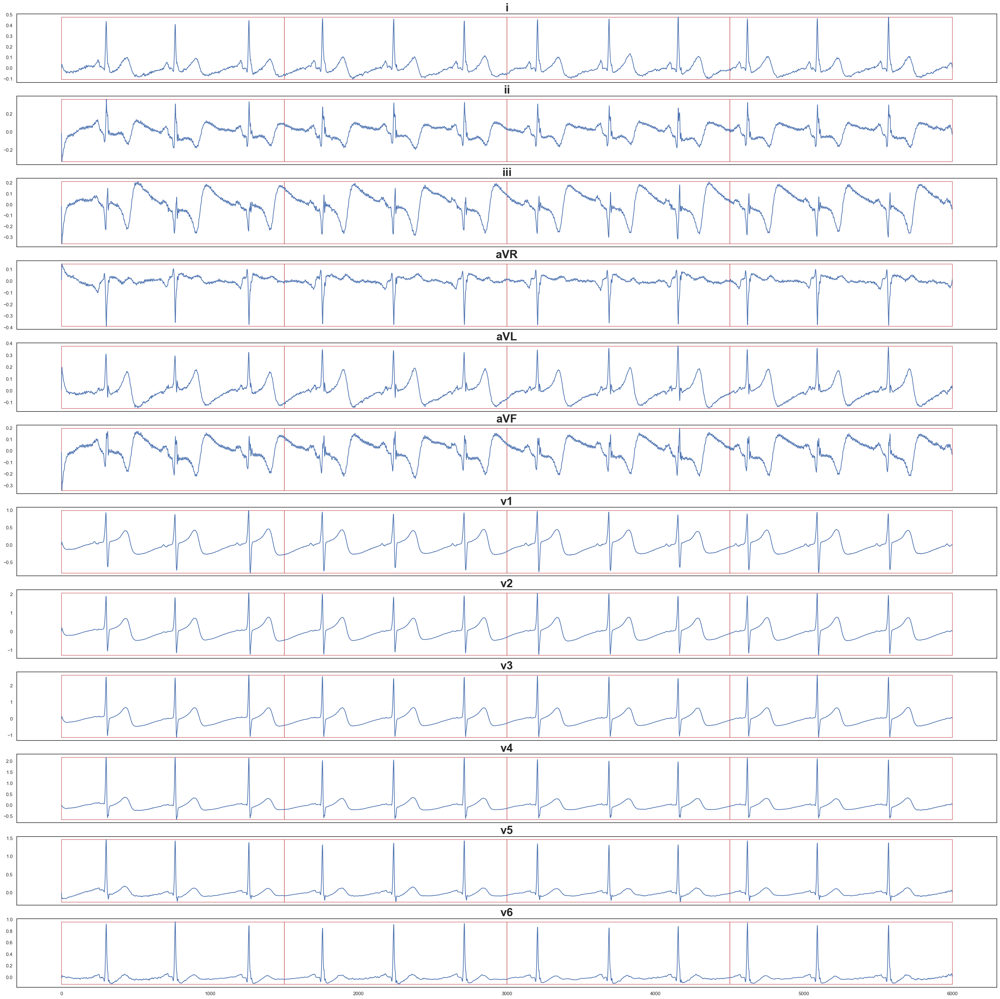

In [171]:
import matplotlib.patches as patches 

patient = list(map_windows.keys())[100]
w = map_windows[patient]
windows = all_windows[w]
windows = torch.unsqueeze(windows, dim=1)
test = y_all_patient[patient]
recon, pred, mean_rec_error, predictions = isSignalAnomalous(patient, windows, best_th, test, n_anomalies_th = 1, device = "cuda", verbose = True)

nchs = 12#15
f, axs = plt.subplots(nchs, 1, sharex=True, figsize= (40, 40))
limit0 = 0
limit1 = 6000
n_windows = int ((limit1 - limit0)/1500)

for ch in range(nchs):
    y_recon = recon[ch, limit0:limit1].cpu().detach().numpy()
    pred_windows = predictions[:n_windows]
    p = patient.split("/")[0]
    s = patient.split("/")[1]
    y = signals[p][s].T[ch, limit0:limit1]
    x = np.arange(0, y.shape[-1], 1)
    axs[ch].plot(x, y)
    axs[ch].set_title(channels[ch], fontweight='bold', fontsize = 26)
    
    i = 0
    for start in range(limit0, limit1, 1500):
        prediction = predictions[i]
        if prediction == 1:
            print(start, end)
            rect = patches.Rectangle((start, min(y)), 1500, abs(min(y)) + max(y), linewidth=1, edgecolor='r', facecolor='none')
            axs[ch].add_patch(rect)
        i += 1
plt.savefig("anomalies_identified.png", dpi = 300)

Patient: patient233/s0457_re.dat Target: 0 Prediction:  0 Windows label: [0] Windows counts: [38]
0 1500 -0.3459427651770257 0.34296090058448614
1500 3000 -0.3459427651770257 0.34296090058448614
3000 4500 -0.3459427651770257 0.34296090058448614
4500 6000 -0.3459427651770257 0.34296090058448614
0 1500 -0.4254193203861354 1.2231891712734333
1500 3000 -0.4254193203861354 1.2231891712734333
3000 4500 -0.4254193203861354 1.2231891712734333
4500 6000 -0.4254193203861354 1.2231891712734333
0 1500 -0.19938039652813397 1.0055158463013354
1500 3000 -0.19938039652813397 1.0055158463013354
3000 4500 -0.19938039652813397 1.0055158463013354
4500 6000 -0.19938039652813397 1.0055158463013354
0 1500 -0.7299959826626561 0.3390528980939932
1500 3000 -0.7299959826626561 0.3390528980939932
3000 4500 -0.7299959826626561 0.3390528980939932
4500 6000 -0.7299959826626561 0.3390528980939932
0 1500 -0.5213977809674427 0.18351202768296068
1500 3000 -0.5213977809674427 0.18351202768296068
3000 4500 -0.521397780967

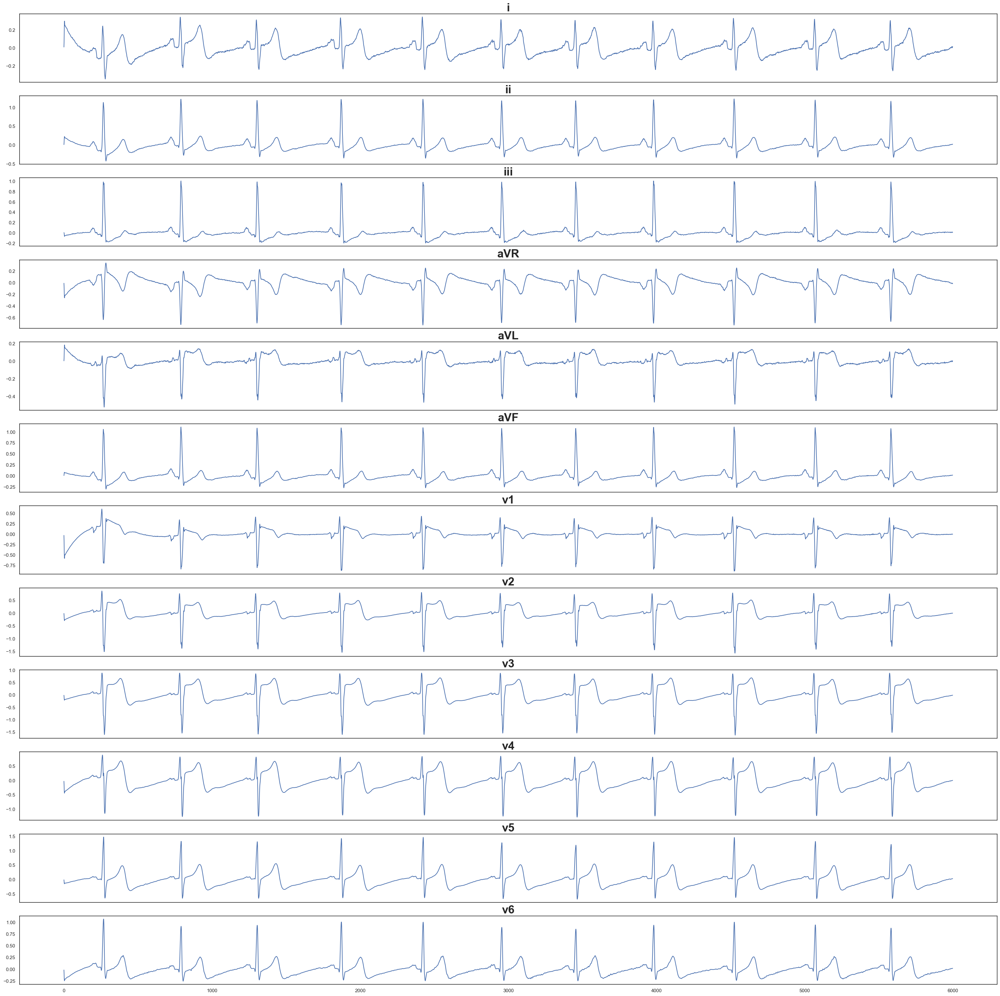

In [172]:
import matplotlib.patches as patches 

patient = list(map_windows.keys())[10]
w = map_windows[patient]
windows = all_windows[w]
windows = torch.unsqueeze(windows, dim=1)
test = y_all_patient[patient]
recon, pred, mean_rec_error, predictions = isSignalAnomalous(patient, windows, best_th, test, n_anomalies_th = 1, device = "cuda", verbose = True)

nchs = 12#15
f, axs = plt.subplots(nchs, 1, sharex=True, figsize= (40, 40))
limit0 = 0
limit1 = 6000
n_windows = int ((limit1 - limit0)/1500)

for ch in range(nchs):
    y_recon = recon[ch, limit0:limit1].cpu().detach().numpy()
    pred_windows = predictions[:n_windows]
    p = patient.split("/")[0]
    s = patient.split("/")[1]
    y = signals[p][s].T[ch, limit0:limit1]
    x = np.arange(0, y.shape[-1], 1)
    axs[ch].plot(x, y)
    axs[ch].set_title(channels[ch], fontweight='bold', fontsize = 26)
    
    i = 0
    for start in range(limit0, limit1, 1500):
        prediction = predictions[i]
        end = start + 1500
        print(start, end, min(y), max(y))
        if prediction == 1:
            rect = patches.Rectangle((start, min(y)), end, abs(min(y)) + max(y), linewidth=1, edgecolor='r', facecolor='none')
            axs[ch].add_patch(rect)
        i += 1
plt.savefig("normal_windows.png", dpi = 300)

torch.Size([15, 57000]) torch.Size([15, 57000])


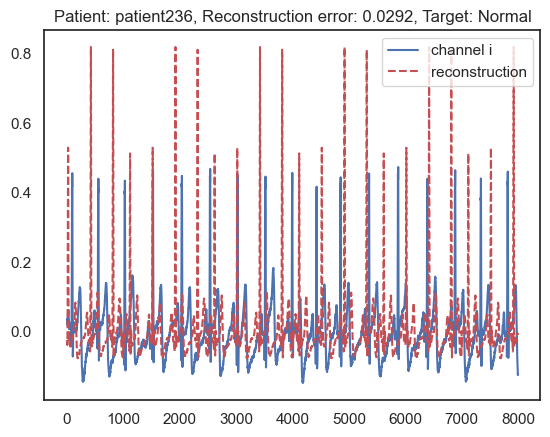

In [91]:
patient_signal = "patient236/s0462_re.dat"
patient = patient_signal.split("/")[0]
signal = patient_signal.split("/")[1]
x = torch.from_numpy(signals[patient][signal].T[:, :recon.shape[-1]]).to(device)
print(x.shape, recon.shape)
reconstruction_error = F.mse_loss(x, recon).item()
y = y_all_patient[patient_signal]
ch = 0
plt.plot(x[ch, 2000:10000].cpu().detach().numpy(), label = "channel {}".format(channels[ch]))
plt.plot(recon[ch, 2000:10000].cpu().detach().numpy(), "--r", label = "reconstruction")
plt.title("Patient: {}, Reconstruction error: {}, Target: {}".format(patient, round(reconstruction_error , 4), map_y_final[y]))
plt.legend()

In [287]:
y_preds_patient = {}
patients_missclassified = []
patients_windows_missclassified = []
signals_all = {}
recons_all = {}
recon_error_patients = {}
normal_mse_patient = []
abnormal_mse_patient = []
for i, (patient_signal, w) in enumerate(map_windows_test.items()):
    print(i+1, "/", len(map_windows_test.keys()), end="\r")
    windows = windows_test[w] 
    windows = torch.unsqueeze(windows, dim = 1)
    test = y_test_patient[patient_signal]
    recons_signal, pred, recon_error, predictions = isSignalAnomalous(patient_signal, windows, best_th, test, n_anomalies_th = 1) 
    recons_all[patient_signal] = recons_signal
    patient = patient_signal.split("/")[0]
    signal = patient_signal.split("/")[1]
    recon_error_patients[patient_signal] = recon_error
    signals_all[patient_signal] = signals[patient][signal]
    y_preds_patient[patient_signal] = pred
    #print(test, pred)
    if test != pred:
        print("missclassified")
        patients_missclassified.append(patient_signal)
        patients_windows_missclassified.append(patient_signal)
    elif len(np.unique(predictions)) > 1: 
        print("missclassified windows")
        patients_windows_missclassified.append(patient_signal)
    if test == 0:
        normal_mse_patient.append(recon_error)
    else:
        abnormal_mse_patient.append(recon_error)

Patient: patient233/s0483_re.dat Target: 0 Prediction:  0 Windows label: [0] Windows counts: [38]
Patient: patient236/s0462_re.dat Target: 0 Prediction:  1 Windows label: [0 1] Windows counts: [36  1]
missclassified
Patient: patient233/s0482_re.dat Target: 0 Prediction:  0 Windows label: [0] Windows counts: [38]
Patient: patient242/s0471_re.dat Target: 0 Prediction:  0 Windows label: [0] Windows counts: [38]
Patient: patient245/s0474_re.dat Target: 0 Prediction:  0 Windows label: [0] Windows counts: [38]
Patient: patient263/s0499_re.dat Target: 0 Prediction:  0 Windows label: [0] Windows counts: [38]
Patient: patient150/s0287lre.dat Target: 0 Prediction:  1 Windows label: [0 1] Windows counts: [35  2]
missclassified
Patient: patient233/s0459_re.dat Target: 0 Prediction:  0 Windows label: [0] Windows counts: [38]
Patient: patient131/s0273lre.dat Target: 0 Prediction:  0 Windows label: [0] Windows counts: [37]
Patient: patient237/s0465_re.dat Target: 0 Prediction:  0 Windows label: [0] W

In [219]:
for patient_signal in patients_windows_missclassified:

    patient = patient_signal.split("/")[0]
    signal = patient_signal.split("/")[1]
    w = map_windows[patient_signal]
    windows = all_windows[w]
    test = y_all_patient[patient_signal]
    print(patient_signal)
    for i, window in enumerate(windows):
        
        x = window.reshape(1, 1, 15, 2000).to(device) 
        recon = model(x).reshape(15, 2000)
        reconstruction_error = F.mse_loss(x[:, :, :, :1500], recon[:, :1500]).item()
        if reconstruction_error >= best_th:
            pred = 1
        else:
            pred = 0
        
        if test != pred:
            ch = 0
            plt.plot(window[ch, :1500], label = "channel {}".format(channels[ch]))
            plt.plot(recon[ch, :1500].cpu().detach().numpy(), "--r", label = "reconstruction")
            plt.title("Patient: {}, Window: {}, Reconstruction error: {}, Target: {}, Prediction: {}".format(patient, i, round(reconstruction_error , 4), map_y_final[test], map_y_final[pred]))
            plt.legend()
            plt.savefig("patient{}_window{}_missclassified.png".format(patient, i), dpi=300, bbox_inches='tight')
            plt.clf()

patient236/s0462_re.dat


C:\Users\Utente\AppData\Local\Temp\ipykernel_18000\3684374940.py:13: UserWarning: Using a target size (torch.Size([15, 1500])) that is different to the input size (torch.Size([1, 1, 15, 1500])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  reconstruction_error = F.mse_loss(x[:, :, :, :1500], recon[:, :1500]).item()


patient150/s0287lre.dat
patient249/s0484_re.dat
patient250/s0485_re.dat


<Figure size 640x480 with 0 Axes>

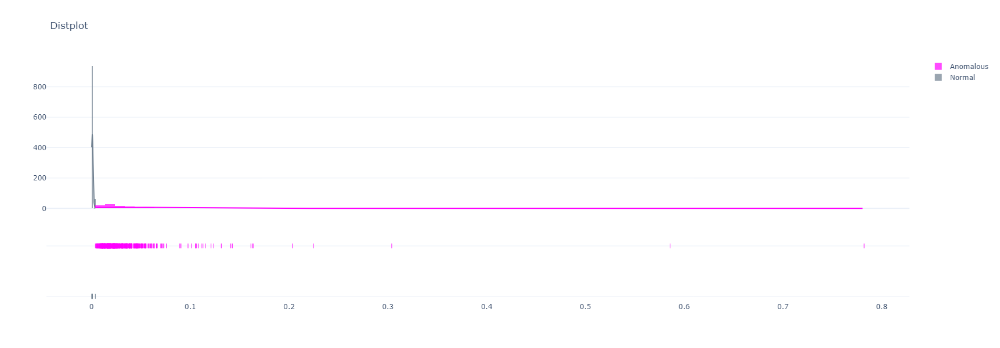

In [93]:
group_labels = ['Normal', 'Anomalous']

colors = ['slategray', 'magenta']

# Create distplot with curve_type set to 'normal'
fig = ff.create_distplot([normal_mse_patient, abnormal_mse_patient], group_labels, bin_size=.0,
                         curve_type='normal', # override default 'kde'
                         colors=colors)
fig.update_layout(title_text='Distplot', template = "plotly_white", height = 600, width = 1200)
fig.show()

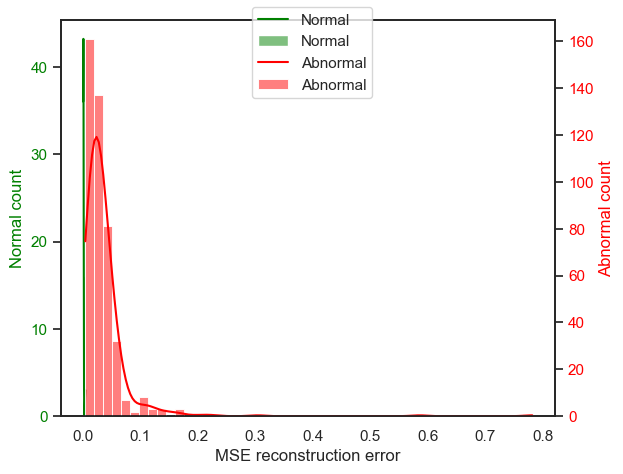

In [94]:
import seaborn as sns 


fig, ax1 = plt.subplots()

ax1.set_xlabel('MSE reconstruction error')
ax1.set_ylabel('Normal count', color="green")
sns.histplot(normal_mse_patient, kde=True,
             bins=1, color = 'green', ax = ax1)
ax1.tick_params(axis='y', labelcolor="green")

ax2 = ax1.twinx()  # instantiate a second axes that shares the same x-axis

ax2.set_ylabel('Abnormal count', color="red")  # we already handled the x-label with ax1
sns.histplot(abnormal_mse_patient, kde=True, 
             bins=50, color = 'red', ax = ax2)
ax2.tick_params(axis='y', labelcolor="red")

fig.tight_layout()  # otherwise the right y-label is slightly clipped
fig.legend(labels = ["Normal", "Normal", "Abnormal", "Abnormal"], loc = "upper center")

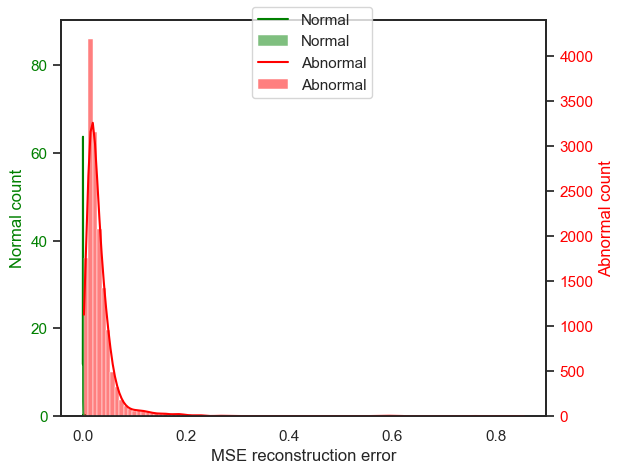

In [95]:
fig, ax1 = plt.subplots()

ax1.set_xlabel('MSE reconstruction error')
ax1.set_ylabel('Normal count', color="green")
sns.histplot(normal_mse, kde=True, 
             bins=100, color = 'green', ax = ax1)
ax1.tick_params(axis='y', labelcolor="green")

ax2 = ax1.twinx()  # instantiate a second axes that shares the same x-axis

ax2.set_ylabel('Abnormal count', color="red")  # we already handled the x-label with ax1
sns.histplot(anomalous_mse, kde=True, 
             bins=100, color = 'red', ax = ax2)
ax2.tick_params(axis='y', labelcolor="red")

fig.tight_layout()  # otherwise the right y-label is slightly clipped
fig.legend(labels = ["Normal", "Normal", "Abnormal", "Abnormal"], loc = "upper center")

Text(0.002699999999999998, 40, 'threshold = 0.0026')

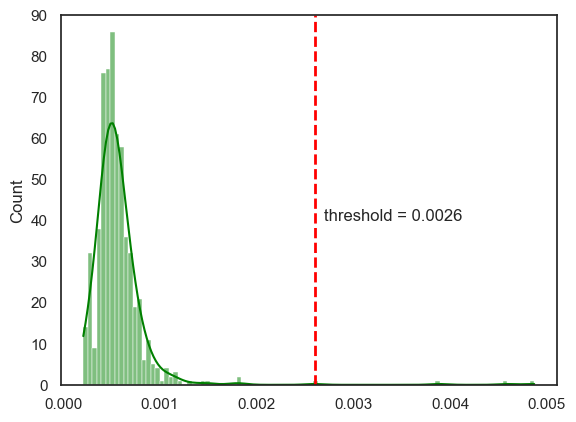

In [458]:
sns.histplot(normal_mse, kde=True, 
             bins=100, color = 'green')
plt.vlines(x = best_th, ymin = 0, ymax = 90, color = "red", linewidth = 2, linestyles = "dashed")
plt.ylim([0, 90])
plt.text(x = best_th + 0.0001, y = 40, s = "threshold = {}".format(round(best_th, 6)))

Text(0.012599999999999998, 4300, 'threshold = 0.0026')

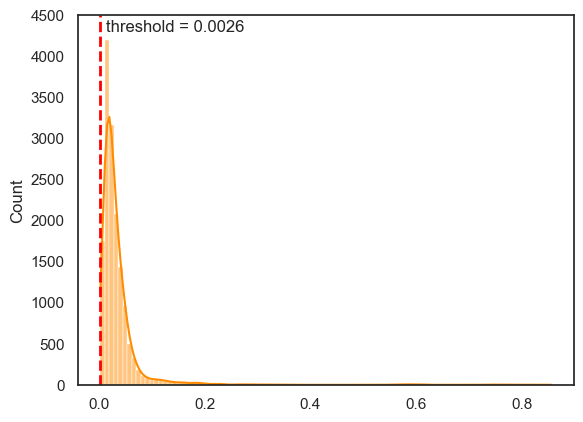

In [468]:
sns.histplot(anomalous_mse, kde=True, 
             bins=100, color = 'darkorange')
plt.vlines(x = best_th, ymin = 0, ymax = 4500, color = "red", linewidth = 2, linestyles = "dashed")
plt.ylim([0, 4500])
plt.text(x = best_th + 0.01, y = 4300, s = "threshold = {}".format(round(best_th, 6)))

In [96]:
y_test_f = []
y_preds_f = []

for patient, test in y_test_patient.items():

    pred = y_preds_patient[patient]
    y_test_f.append(test)
    y_preds_f.append(pred)

In [97]:
len(y_preds_f), len(y_test_f)

(458, 458)

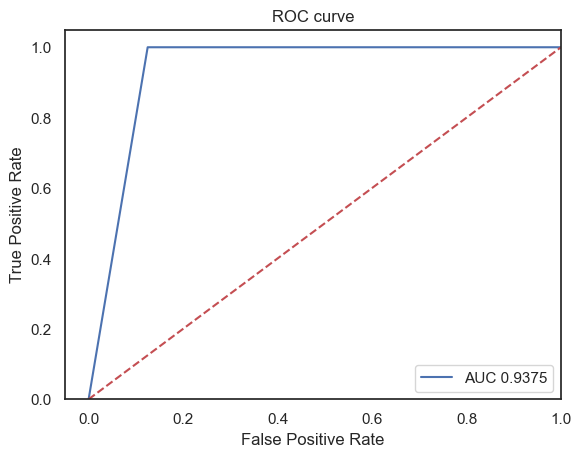

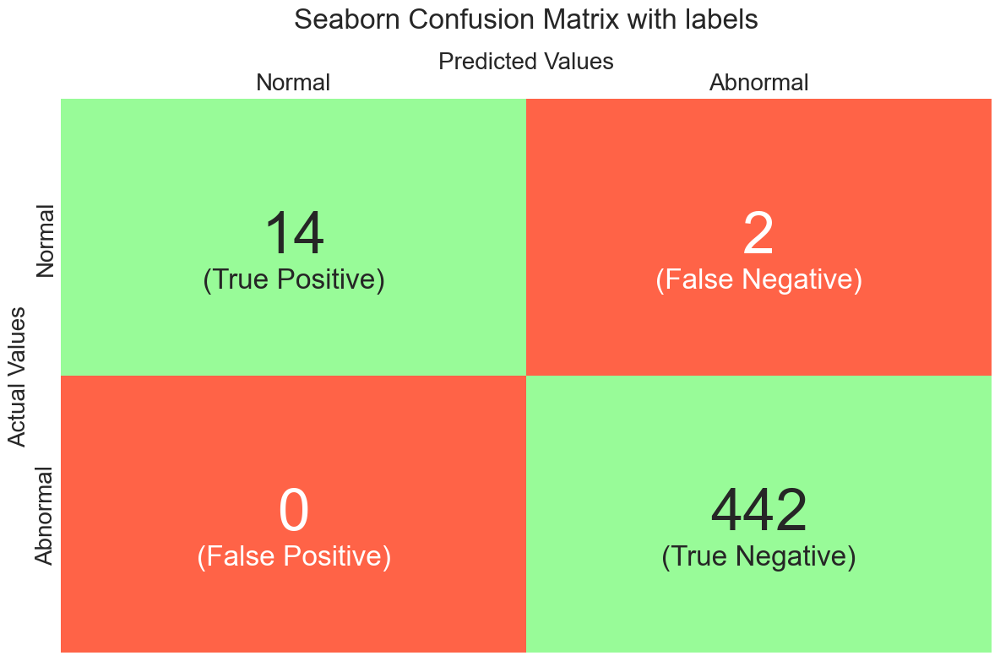

Accuracy: 0.9956331877729258 
 F1 score: 0.9333333333333333 
 Sensitivity: 0.875 
 Specificity: 1.0 
 ROC AUC score: 0.9375 
 False Allarm Rate: 0.125, Missed Allarm Rate: 0.0 
 Confusion Matrix: 
 [[ 14   2]
 [  0 442]] 
 Classification Report: 
               precision    recall  f1-score   support

           0       1.00      0.88      0.93        16
           1       1.00      1.00      1.00       442

    accuracy                           1.00       458
   macro avg       1.00      0.94      0.97       458
weighted avg       1.00      1.00      1.00       458
 



In [98]:
rocauc, to_print = validate_model(y_test_f, y_preds_f)
print(to_print)

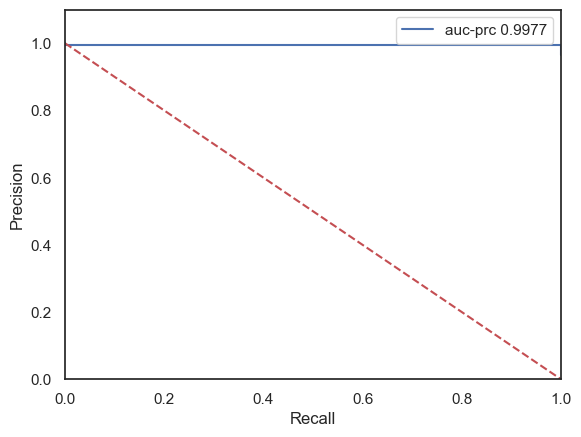

In [99]:
from sklearn.metrics import PrecisionRecallDisplay, precision_recall_curve

prec, recall, _ = precision_recall_curve(y_test_f, y_preds_f)
auc_pr = auc(recall, prec)
pr_display = PrecisionRecallDisplay(precision=prec, recall=recall).plot(label="auc-prc {}".format(round(auc_pr, 4)))
plt.plot([0, 1], [1, 0], "--r")
plt.xlim([0, 1])
plt.ylim([0, 1.1])
plt.legend()

In [106]:
y_preds_patient = {}
patients_missclassified = []
signals_all = {}
recons_all = {}
recon_error_patients = {}
normal_mse_patient = []
abnormal_mse_patient = []
for i, (patient_signal, w) in enumerate(map_windows_test.items()):
    print(i+1, "/", len(map_windows_test.keys()), end="\r")
    windows = windows_test[w] 
    #windows = torch.squeeze(windows, dim = 1)
    test = y_test_patient[patient_signal]
    recons_signal, pred, recon_error, predictions = isSignalAnomalous(patient_signal, windows, 0.005, test, n_anomalies_th = 1) 
    recons_all[patient_signal] = recons_signal
    patient = patient_signal.split("/")[0]
    signal = patient_signal.split("/")[1]
    recon_error_patients[patient_signal] = recon_error
    signals_all[patient_signal] = signals[patient][signal]
    y_preds_patient[patient_signal] = pred
    if test != pred:
        patients_missclassified.append(patients)
    if test == 0:
        normal_mse_patient.append(recon_error)
    else:
        abnormal_mse_patient.append(recon_error)

Patient: patient233/s0483_re.dat Target: 0 Prediction:  0 Windows label: [0] Windows counts: [38]
Patient: patient236/s0462_re.dat Target: 0 Prediction:  0 Windows label: [0] Windows counts: [37]
Patient: patient233/s0482_re.dat Target: 0 Prediction:  0 Windows label: [0] Windows counts: [38]
Patient: patient242/s0471_re.dat Target: 0 Prediction:  0 Windows label: [0] Windows counts: [38]
Patient: patient245/s0474_re.dat Target: 0 Prediction:  0 Windows label: [0] Windows counts: [38]
Patient: patient263/s0499_re.dat Target: 0 Prediction:  0 Windows label: [0] Windows counts: [38]
Patient: patient150/s0287lre.dat Target: 0 Prediction:  0 Windows label: [0] Windows counts: [37]
Patient: patient233/s0459_re.dat Target: 0 Prediction:  0 Windows label: [0] Windows counts: [38]
Patient: patient131/s0273lre.dat Target: 0 Prediction:  0 Windows label: [0] Windows counts: [37]
Patient: patient237/s0465_re.dat Target: 0 Prediction:  0 Windows label: [0] Windows counts: [38]
Patient: patient279/

In [101]:
y_test_f = []
y_preds_f = []

for patient, test in y_test_patient.items():

    pred = y_preds_patient[patient]
    y_test_f.append(test)
    y_preds_f.append(pred)

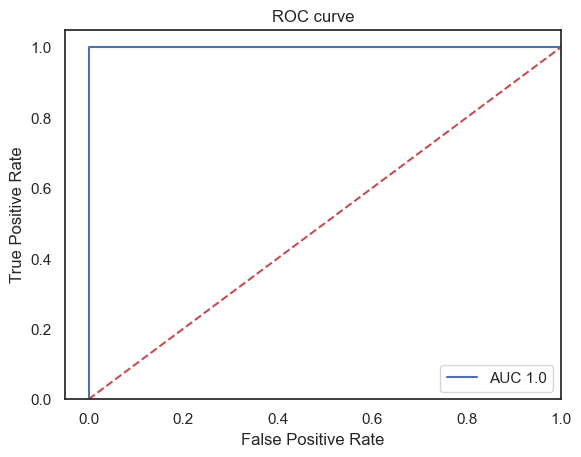

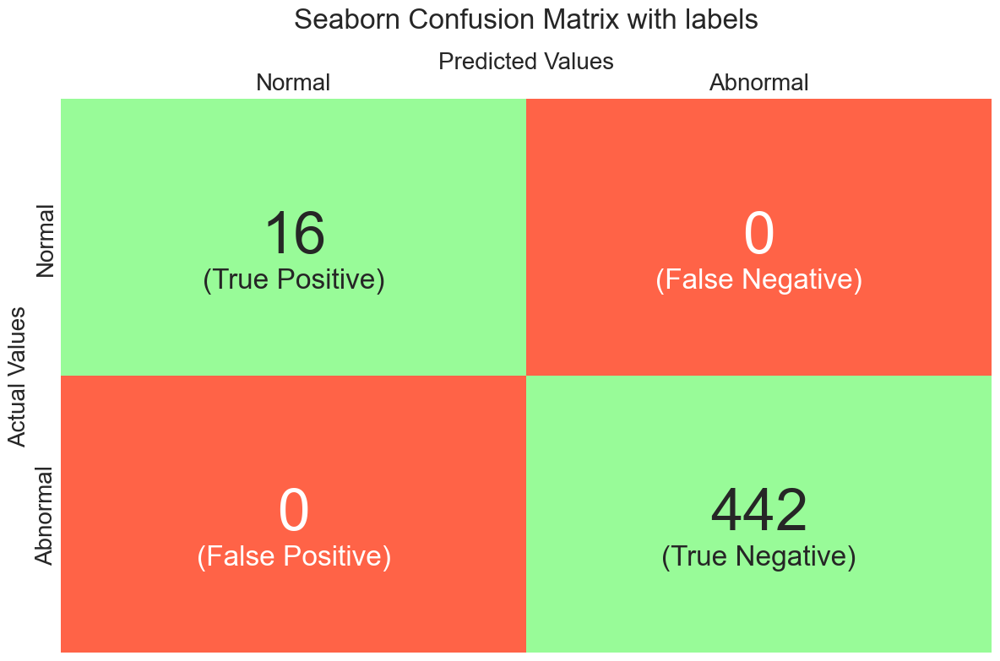

Accuracy: 1.0 
 F1 score: 1.0 
 Sensitivity: 1.0 
 Specificity: 1.0 
 ROC AUC score: 1.0 
 False Allarm Rate: 0.0, Missed Allarm Rate: 0.0 
 Confusion Matrix: 
 [[ 16   0]
 [  0 442]] 
 Classification Report: 
               precision    recall  f1-score   support

           0       1.00      1.00      1.00        16
           1       1.00      1.00      1.00       442

    accuracy                           1.00       458
   macro avg       1.00      1.00      1.00       458
weighted avg       1.00      1.00      1.00       458
 



In [102]:
rocauc, to_print = validate_model(y_test_f, y_preds_f)
print(to_print)

In [141]:
from torch.functional import F 

fs = 500 
nchs = 15 
n_record = 2000
interval2 = 1500
interval = 2000
reconstruction_errors = []
n = all_windows.shape[0]

for i, batch_data in enumerate(all_windows): 
    
    #print(batch_data.shape)
    batch_data = torch.unsqueeze(batch_data, dim = 0).to(device)
    batch_data = torch.unsqueeze(batch_data, dim = 0)
    #print(batch_data.shape)
    reconstruction_all = np.zeros((nchs, n_record))        

    with torch.no_grad():

        reconstruction = model(batch_data)
        reconstruction_error = F.mse_loss(reconstruction[0, 0, :, :interval2], batch_data[0, 0, :, :interval2]).item()
        print(i+1, "/", n, "Recon error:", round(reconstruction_error, 6), end = "\r")
        reconstruction_errors.append(reconstruction_error)
        recon_np = (reconstruction[0, 0, :, :interval].cpu().detach().numpy()).reshape(1, nchs, interval)
        reconstruction_all[:, :] = recon_np[0, :, :interval]

        torch.cuda.empty_cache()

In [142]:
len(reconstruction_errors)

18380

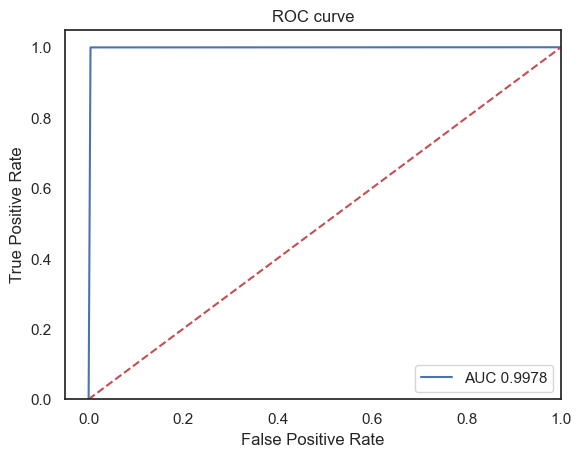

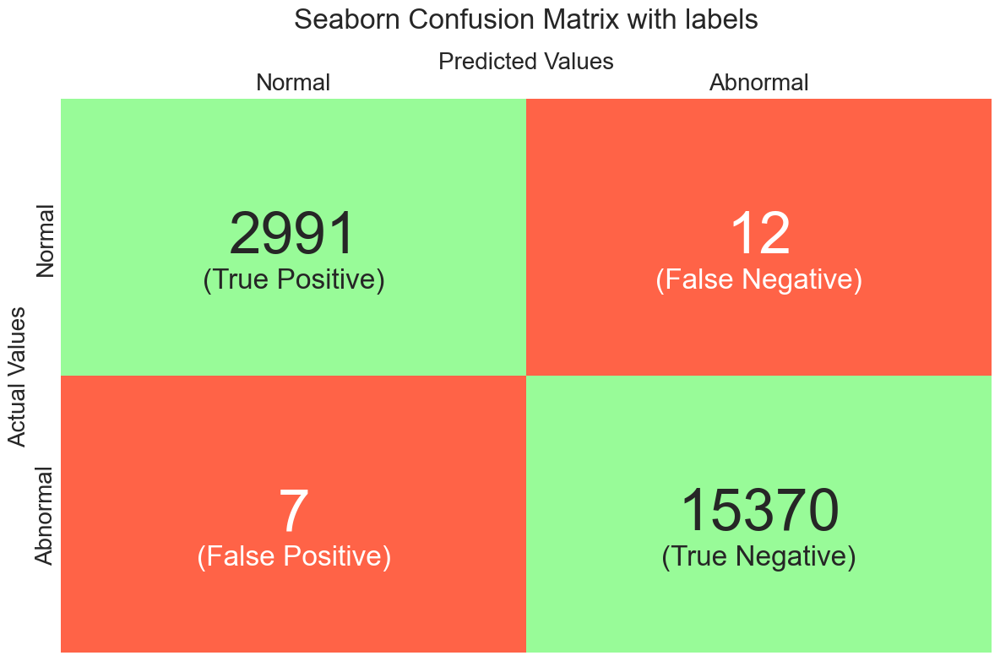

In [144]:
from time import sleep
best_th = 0.0
best_auc = 0.0
normal_mse = []
anomalous_mse = []
count_decr = 0 

tprs = [0]
fprs = [0]
thresholds = np.arange(0.00001, 0.1, 0.00001)
for j, threshold in enumerate(thresholds):
    print(threshold)
    y_preds = []
    for i, recon_error in enumerate(reconstruction_errors):

        if j == 0:
            if all_y[i] == 0:
                normal_mse.append(recon_error)
            else:
                anomalous_mse.append(recon_error)

        if recon_error > threshold:
            y_preds.append(1)
        else:
            y_preds.append(0)
                
        y = all_y[i]
        
    sleep(0.5)
    clear_output(wait = True)
    metrics, to_print = validate_model(all_y, y_preds)
    auc_score = metrics["auc_score"]
    if auc_score > best_auc:
        best_th = threshold
        best_auc = auc_score
    if auc_score < best_auc:
        count_decr += 1
    if count_decr >= 50: 
        break
    print(to_print)
    fpr, tpr, _ = roc_curve(all_y, y_preds)
    fprs.append(fpr[1])
    tprs.append(tpr[1])
fprs.append(1)
tprs.append(1)

In [239]:
best_th, best_auc

(0.0028000000000000047, 0.9978394175246618)

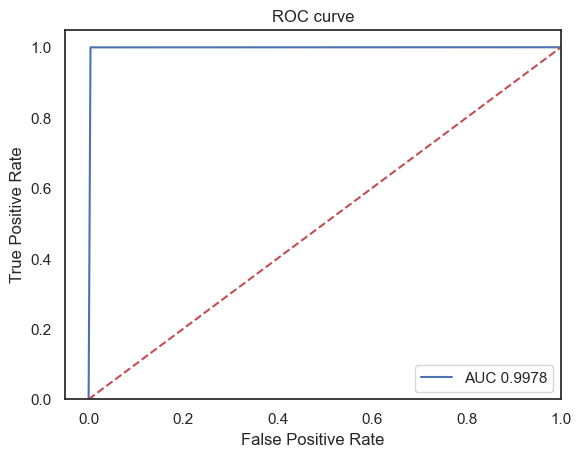

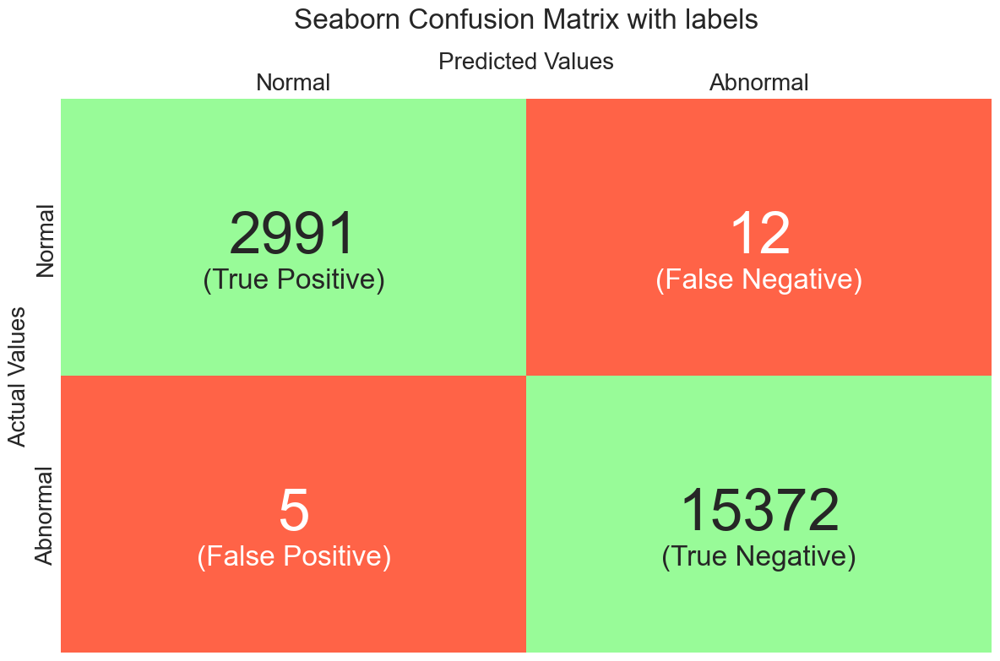

Accuracy: 0.9990750816104461 
 F1 score: 0.9971661943657275 
 Sensitivity: 0.996003996003996 
 Specificity: 0.9996748390453274 
 ROC AUC score: 0.9978394175246618 
 False Allarm Rate: 0.003996003996003996, Missed Allarm Rate: 0.0003251609546725629 
 Confusion Matrix: 
 [[ 2991    12]
 [    5 15372]] 
 Classification Report: 
               precision    recall  f1-score   support

           0       1.00      1.00      1.00      3003
           1       1.00      1.00      1.00     15377

    accuracy                           1.00     18380
   macro avg       1.00      1.00      1.00     18380
weighted avg       1.00      1.00      1.00     18380
 



In [240]:
from time import sleep

y_preds = []
for i, recon_error in enumerate(reconstruction_errors):
    
    if recon_error > best_th:
        y_preds.append(1)
    else:
        y_preds.append(0)
                
    y = all_y[i]
        
metrics, to_print = validate_model(all_y, y_preds)
auc_score = metrics["auc_score"]
print(to_print)

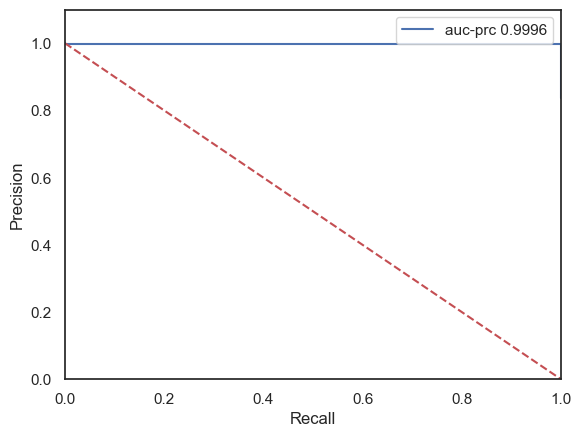

In [241]:
from sklearn.metrics import PrecisionRecallDisplay, precision_recall_curve

prec, recall, _ = precision_recall_curve(all_y, y_preds)
auc_pr = auc(recall, prec)
pr_display = PrecisionRecallDisplay(precision=prec, recall=recall).plot(label="auc-prc {}".format(round(auc_pr, 4)))
plt.plot([0, 1], [1, 0], "--r")
plt.xlim([0, 1])
plt.ylim([0, 1.1])
plt.legend()

In [242]:
y_preds_patient = {}
patients_missclassified = []
recons_all = {}
signal_all = {} 
normal_mse_patient = []
abnormal_mse_patient = []
recon_error_patient = {}

for i, (patient_signal, w) in enumerate(map_windows.items()):
    print(i+1, "/", len(map_windows.keys()), patient, end="\r")
    windows = all_windows[w] 
    windows = torch.unsqueeze(windows, dim = 1)
    test = y_all_patient[patient_signal]
    recons_signal, pred, recon_error, predictions  = isSignalAnomalous(patient_signal, windows, best_th, test, n_anomalies_th = 2) 
    patient = patient_signal.split("/")[0]
    signal = patient_signal.split("/")[1]
    recon_error_patient[patient_signal] = recon_error
    signals_all[patient_signal] = signals[patient][signal]
    recons_all[patient_signal] = recons_signal
    y_preds_patient[patient_signal] = pred
    #print(y_preds_patient)
    if test != pred:
        patients_missclassified.append(patient_signal)
    if test == 0:
        normal_mse_patient.append(recon_error)
    else:
        abnormal_mse_patient.append(recon_error)
        

Patient: patient235/s0461_re.dat Target: 0 Prediction:  0 Windows label: [0] Windows counts: [38]
Patient: patient169/s0329lre.dat Target: 0 Prediction:  0 Windows label: [0] Windows counts: [37]
Patient: patient248/s0481_re.dat Target: 0 Prediction:  0 Windows label: [0] Windows counts: [38]
Patient: patient174/s0325lre.dat Target: 0 Prediction:  0 Windows label: [0] Windows counts: [37]
Patient: patient156/s0299lre.dat Target: 0 Prediction:  0 Windows label: [0] Windows counts: [37]
Patient: patient234/s0460_re.dat Target: 0 Prediction:  0 Windows label: [0] Windows counts: [38]
Patient: patient236/s0463_re.dat Target: 0 Prediction:  1 Windows label: [0 1] Windows counts: [36  2]
Patient: patient276/s0526_re.dat Target: 0 Prediction:  0 Windows label: [0] Windows counts: [38]
Patient: patient155/s0301lre.dat Target: 0 Prediction:  0 Windows label: [0] Windows counts: [37]
Patient: patient260/s0496_re.dat Target: 0 Prediction:  0 Windows label: [0] Windows counts: [38]
Patient: patien

In [ ]:
group_labels = ['Normal', 'Anomalous']

colors = ['slategray', 'magenta']

# Create distplot with curve_type set to 'normal'
fig = ff.create_distplot([normal_mse_patient, abnormal_mse_patient], group_labels, bin_size=.0,
                         curve_type='normal', # override default 'kde'
                         colors=colors)
fig.update_layout(title_text='Distplot', template = "plotly_white", height = 600, width = 1200)
fig.show()

In [243]:
y_test_f = []
y_preds_f = []

for patient, test in y_all_patient.items():

    pred = y_preds_patient[patient]
    y_test_f.append(test)
    y_preds_f.append(pred)

In [244]:
sns.histplot(normal_mse, kde=True, 
             bins=100, color = 'green')
plt.vlines(x = best_th, ymin = 0, ymax = 900, color = "red", linewidth = 2, linestyles = "dashed")
plt.ylim([0, 900])
plt.text(x = best_th + 0.0001, y = 500, s = "threshold = {}".format(round(best_th, 6)))
plt.text(x = best_th + 0.0003, y = 250, s = "FP", color = "red")
plt.text(x = best_th - 0.001, y = 250, s = "TP", color = "green")

NameError: name 'sns' is not defined

In [ ]:
sns.histplot(anomalous_mse, kde=True, 
             bins=100, color = 'darkorange')
plt.vlines(x = best_th, ymin = 0, ymax = 4500, color = "red", linewidth = 2, linestyles = "dashed")
plt.ylim([0, 4500])
plt.text(x = best_th + 0.01, y = 4300, s = "threshold = {}".format(round(best_th, 6)))
plt.text(x = best_th + 0.2, y = 2150, s = "TN", color = "green")
plt.text(x = best_th - 0.045, y = 2150, s = "FN", color = "red")

In [ ]:
len(y_preds_f), len(y_test_f)

In [ ]:
rocauc, to_print = validate_model(y_test_f, y_preds_f)
print(to_print)#0.8395079185520362

In [ ]:
y_missclassified = {}
for patient_signal in patients_missclassified:
    patient = patient_signal.split("/")[0]
    signal = patient_signal.split("/")[1]
    true = y_patients[patient][signal]
    y_missclassified[patient_signal] = true
y_missclassified

In [ ]:
from sklearn.metrics import PrecisionRecallDisplay, precision_recall_curve

prec, recall, _ = precision_recall_curve(y_test_f, y_preds_f)
auc_pr = auc(recall, prec)
pr_display = PrecisionRecallDisplay(precision=prec, recall=recall).plot(label="auc-prc {}".format(round(auc_pr, 4)))
plt.plot([0, 1], [1, 0], "--r")
plt.xlim([0, 1])
plt.ylim([0, 1.1])
plt.legend()

In [ ]:
import plotly.figure_factory as ff
import numpy as np


group_labels = ['Normal', 'Anomalous']

colors = ['slategray', 'magenta']

# Create distplot with curve_type set to 'normal'
fig = ff.create_distplot([normal_mse, anomalous_mse], group_labels, bin_size=.5,
                         curve_type='normal', # override default 'kde'
                         colors=colors)

In [ ]:
fig.update_layout(title_text='Distplot', template = "plotly_white", height = 600, width = 1200)
fig.show()

In [ ]:
def read_all_diagnose(patient, signal):
    
    path = os.getcwd()+os.sep+"ptb-diagnostic-ecg-database-1.0.0"+os.sep
    filename = path + patient+os.sep+signal[:-4]+".hea"
    with open(filename, "r") as file:
        lines = file.readlines()
        lines = lines[18:32]  
        
    all_diagnose = ""
    for line in lines:
        all_diagnose+= line
    return all_diagnose

In [ ]:
for patient_signal in patients_missclassified:
    patient = patient_signal.split("/")[0]
    signal = patient_signal.split("/")[1]
    test = y_all_patient[patient_signal]
    w = map_windows[patient_signal]
    windows = all_windows[w]
    windows = torch.unsqueeze(windows, dim = 1)
    recons_signal, pred, recon_error, predictions  = isSignalAnomalous(patient_signal, windows, best_th, test, n_anomalies_th = 1) 
    all_diagnose = read_all_diagnose(patient, signal)
    print("Patient: {}, Signal: {}, Target: {}, Prediction: {}, Diagnose: \n{} \n".format(patient, signal, test, pred, all_diagnose))
    signal = signals[patient][signal].T
    plt.plot(signal[0, 3000:10000], label = "channel {}".format(channels[0]))
    plt.plot(recons_signal[0, 3000:10000].cpu().detach().numpy(), "--r", label = "reconstruction")
    plt.title("Reconstruction error: {}, True: {}, Pred: {}".format(round(recon_error , 4), map_y_final[test], map_y_final[pred]))
    plt.legend(loc="upper right")
    plt.show()

Text(0.002290000000000006, 7, 'TP')

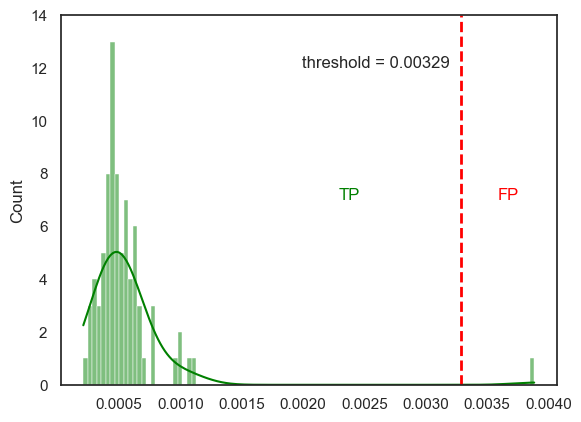

In [535]:
sns.histplot(normal_mse_patient, kde=True, 
             bins=100, color = 'green')
plt.vlines(x = best_th, ymin = 0, ymax = 14, color = "red", linewidth = 2, linestyles = "dashed")
plt.ylim([0, 14])
plt.text(x = best_th - 0.0013, y = 12, s = "threshold = {}".format(round(best_th, 6)))
plt.text(x = best_th + 0.0003, y = 7, s = "FP", color = "red")
plt.text(x = best_th - 0.001, y = 7, s = "TP", color = "green")

Text(-0.03670999999999999, 52.5, 'FN')

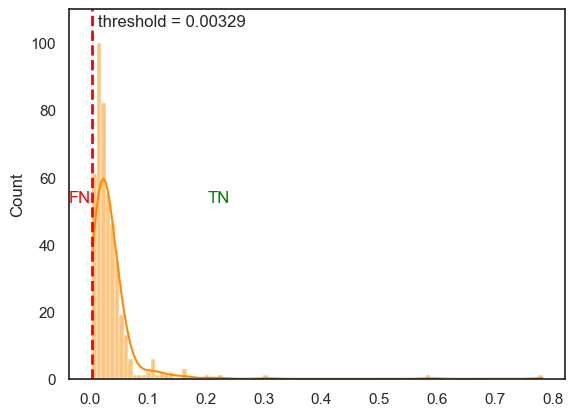

In [547]:
sns.histplot(abnormal_mse_patient, kde=True, 
             bins=100, color = 'darkorange')
plt.vlines(x = best_th, ymin = 0, ymax = 110, color = "red", linewidth = 2, linestyles = "dashed")
plt.ylim([0, 110])
plt.text(x = best_th + 0.01, y = 105, s = "threshold = {}".format(round(best_th, 6)))
plt.text(x = best_th + 0.2, y = 52.5, s = "TN", color = "green")
plt.text(x = best_th - 0.04, y = 52.5, s = "FN", color = "red")

In [ ]:
y_preds_patient = {}
patients_missclassified = []
signals_all = {}
recons_all = {}
recon_error_patients = {}
normal_mse_patient = []
abnormal_mse_patient = []
for i, (patient_signal, w) in enumerate(map_windows_test.items()):
    print(i+1, "/", len(map_windows_test.keys()), end="\r")
    windows = windows_test[w] 
    test = y_test_patient[patient_signal]
    recons_signal, pred, recon_error, predictions = isSignalAnomalous(patient_signal, windows, 0.007, test, n_anomalies_th = 1) 
    recons_all[patient_signal] = recons_signal
    patient = patient_signal.split("/")[0]
    signal = patient_signal.split("/")[1]
    recon_error_patients[patient_signal] = recon_error
    signals_all[patient_signal] = signals[patient][signal]
    y_preds_patient[patient_signal] = pred
    if test != pred:
        patients_missclassified.append(patients)
    if test == 0:
        normal_mse_patient.append(recon_error)
    else:
        abnormal_mse_patient.append(recon_error)

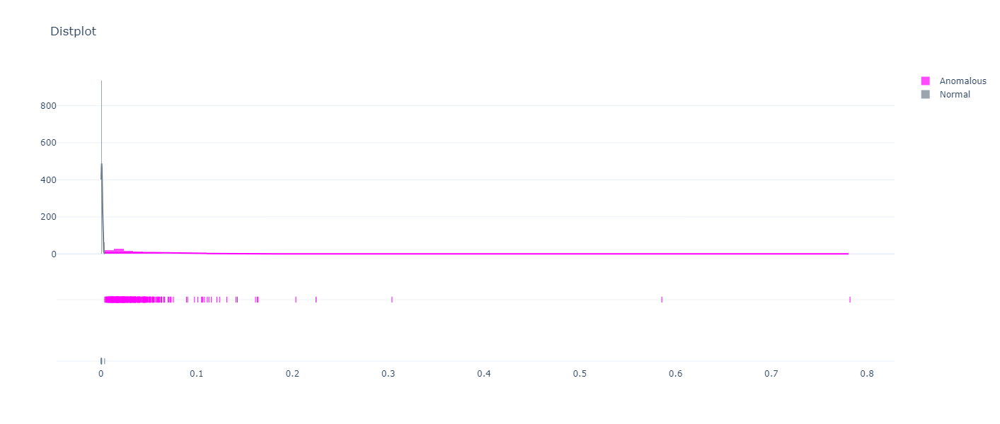

In [549]:
group_labels = ['Normal', 'Anomalous']

colors = ['slategray', 'magenta']

# Create distplot with curve_type set to 'normal'
fig = ff.create_distplot([normal_mse_patient, abnormal_mse_patient], group_labels, bin_size=.0,
                         curve_type='normal', # override default 'kde'
                         colors=colors)
fig.update_layout(title_text='Distplot', template = "plotly_white", height = 600, width = 1200)
fig.show()

In [ ]:
y_test_f = []
y_preds_f = []

for patient, test in y_test_patient.items():

    pred = y_preds_patient[patient]
    y_test_f.append(test)
    y_preds_f.append(pred)

In [551]:
len(y_preds_f), len(y_test_f)

(458, 458)

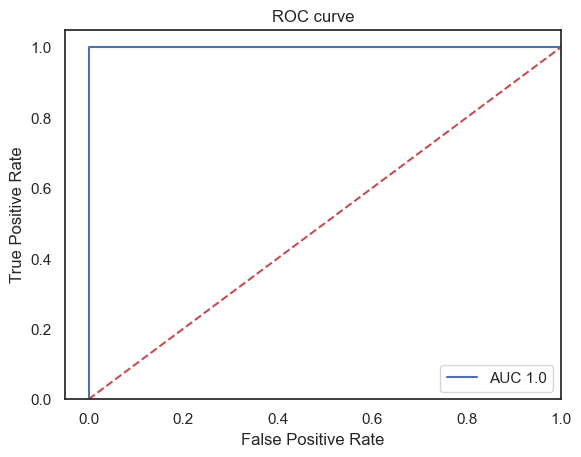

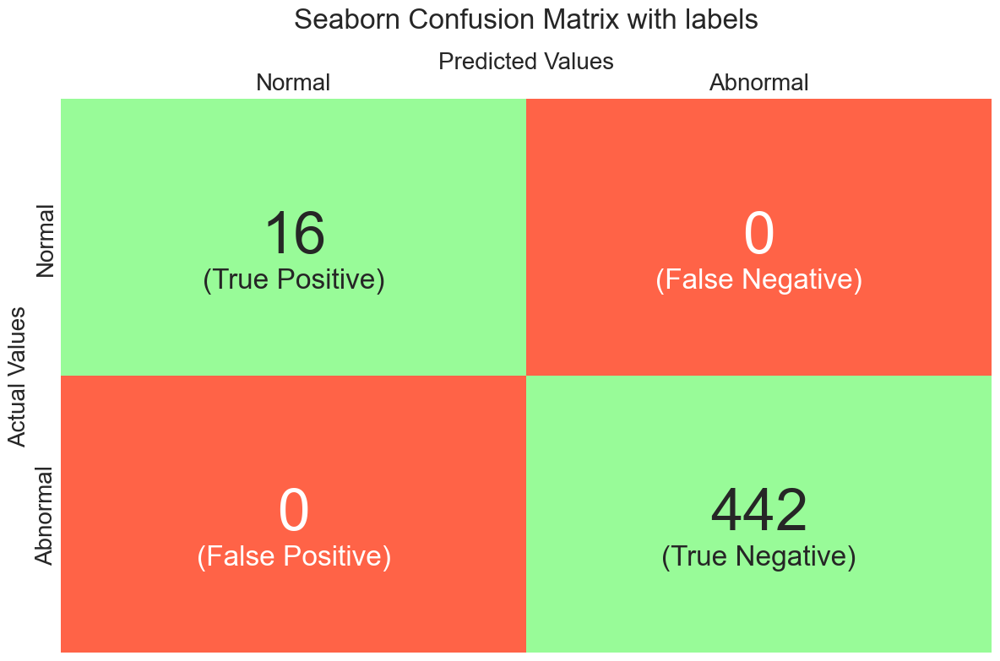

Accuracy: 1.0 
 F1 score: 1.0 
 Sensitivity: 1.0 
 Specificity: 1.0 
 ROC AUC score: 1.0 
 False Allarm Rate: 0.0, Missed Allarm Rate: 0.0 
 Confusion Matrix: 
 [[ 16   0]
 [  0 442]] 
 Classification Report: 
               precision    recall  f1-score   support

           0       1.00      1.00      1.00        16
           1       1.00      1.00      1.00       442

    accuracy                           1.00       458
   macro avg       1.00      1.00      1.00       458
weighted avg       1.00      1.00      1.00       458
 



In [552]:
rocauc, to_print = validate_model(y_test_f, y_preds_f)
print(to_print)

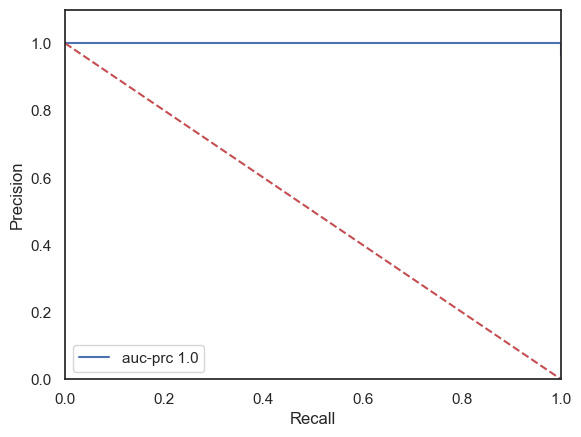

In [553]:
from sklearn.metrics import PrecisionRecallDisplay, precision_recall_curve

prec, recall, _ = precision_recall_curve(y_test_f, y_preds_f)
auc_pr = auc(recall, prec)
pr_display = PrecisionRecallDisplay(precision=prec, recall=recall).plot(label="auc-prc {}".format(round(auc_pr, 4)))
plt.plot([0, 1], [1, 0], "--r")
plt.xlim([0, 1])
plt.ylim([0, 1.1])
plt.legend()

In [145]:
if torch.cuda.is_available():
    model_s = dpnet_loader.load() #load auto encoder model
else:
    model_s = dpnet_loader.load_cpu()

In [146]:
from torch.functional import F 

fs = 500 
nchs = 15 
n_record = 2000
interval2 = 1500
interval = 2000
reconstruction_errors = []
n = all_windows.shape[0]

for i, batch_data in enumerate(all_windows): 
    
    #print(batch_data.shape)
    batch_data = torch.unsqueeze(batch_data, dim = 0).to(device)
    batch_data = torch.unsqueeze(batch_data, dim = 0)
    #print(batch_data.shape)
    reconstruction_all = np.zeros((nchs, n_record))        

    with torch.no_grad():

        reconstruction = model_s(batch_data)
        reconstruction_error = F.mse_loss(reconstruction[0, 0, :, :interval2], batch_data[0, 0, :, :interval2]).item()
        print(i+1, "/", n, "Recon error:", round(reconstruction_error, 6), end = "\r")
        reconstruction_errors.append(reconstruction_error)
        recon_np = (reconstruction[0, 0, :, :interval].cpu().detach().numpy()).reshape(1, nchs, interval)
        reconstruction_all[:, :] = recon_np[0, :, :interval]

        torch.cuda.empty_cache()

In [137]:
len(reconstruction_errors)

18380

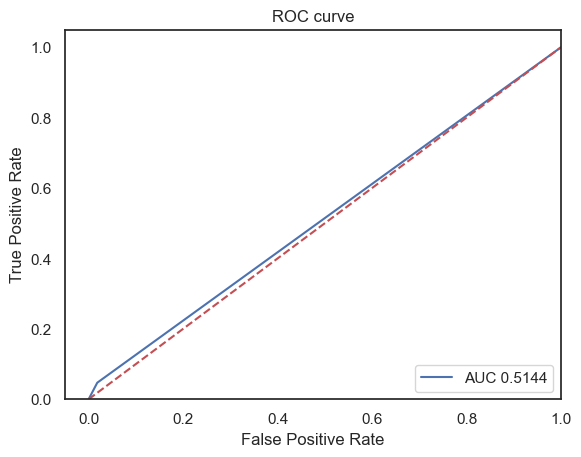

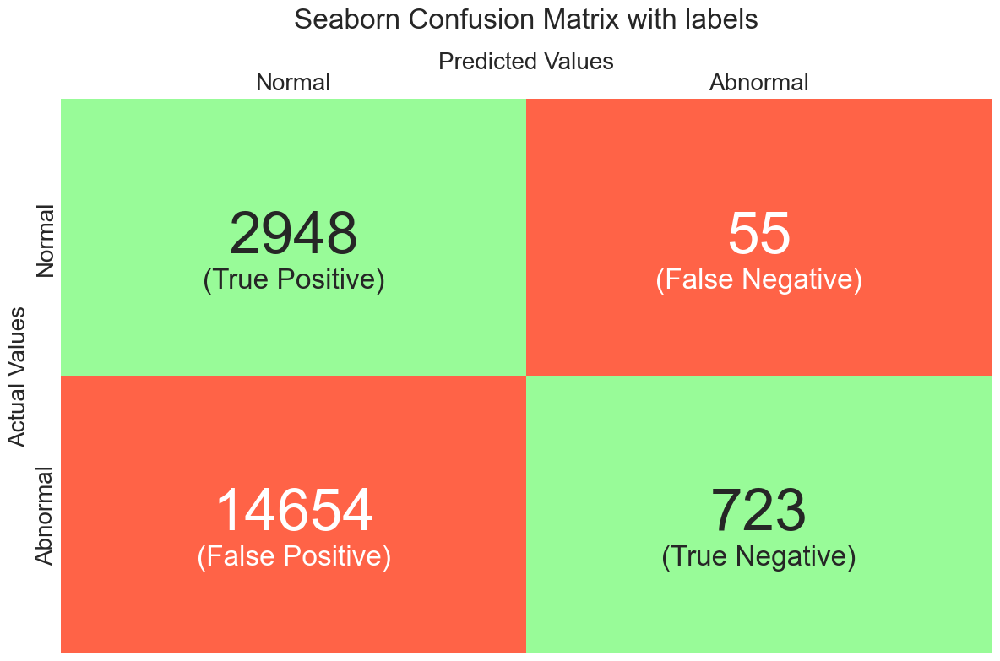

Accuracy: 0.19972796517954297 
 F1 score: 0.2861441397719 
 Sensitivity: 0.9816849816849816 
 Specificity: 0.0470182740456526 
 ROC AUC score: 0.5143516278653172 
 False Allarm Rate: 0.018315018315018316, Missed Allarm Rate: 0.9529817259543474 
 Confusion Matrix: 
 [[ 2948    55]
 [14654   723]] 
 Classification Report: 
               precision    recall  f1-score   support

           0       0.17      0.98      0.29      3003
           1       0.93      0.05      0.09     15377

    accuracy                           0.20     18380
   macro avg       0.55      0.51      0.19     18380
weighted avg       0.80      0.20      0.12     18380
 



In [147]:
from time import sleep
best_th = 0.0
best_auc = 0.0
normal_mse = []
anomalous_mse = []
count_decr = 0 
fprs_s = [0]
tprs_s = [0]

thresholds = np.arange(0.0005, 0.1, 0.0005)
for j, threshold in enumerate(thresholds):
    print(threshold)
    y_preds = []
    for i, recon_error in enumerate(reconstruction_errors):

        if j == 0:
            if all_y[i] == 0:
                normal_mse.append(recon_error)
            else:
                anomalous_mse.append(recon_error)

        if recon_error > threshold:
            y_preds.append(1)
        else:
            y_preds.append(0)
                
        y = all_y[i]
        
    sleep(0.5)
    clear_output(wait = True)
    metrics, to_print = validate_model(all_y, y_preds)
    auc_score = metrics["auc_score"]
    if auc_score > best_auc:
        best_th = threshold
        best_auc = auc_score
    if auc_score < best_auc:
        count_decr += 1
    if count_decr >= 10: 
        pass
    
    fpr, tpr, _ = roc_curve(all_y, y_preds)
    fprs_s.append(fpr[1])
    tprs_s.append(tpr[1])
    print(to_print)
    
fprs_s.append(1)
tprs_s.append(1)

In [148]:
best_th, best_auc#(0.01, 0.82336)

(0.0225, 0.65323104417206)

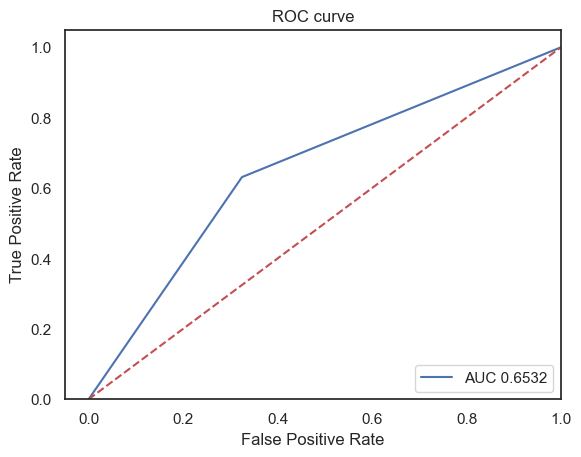

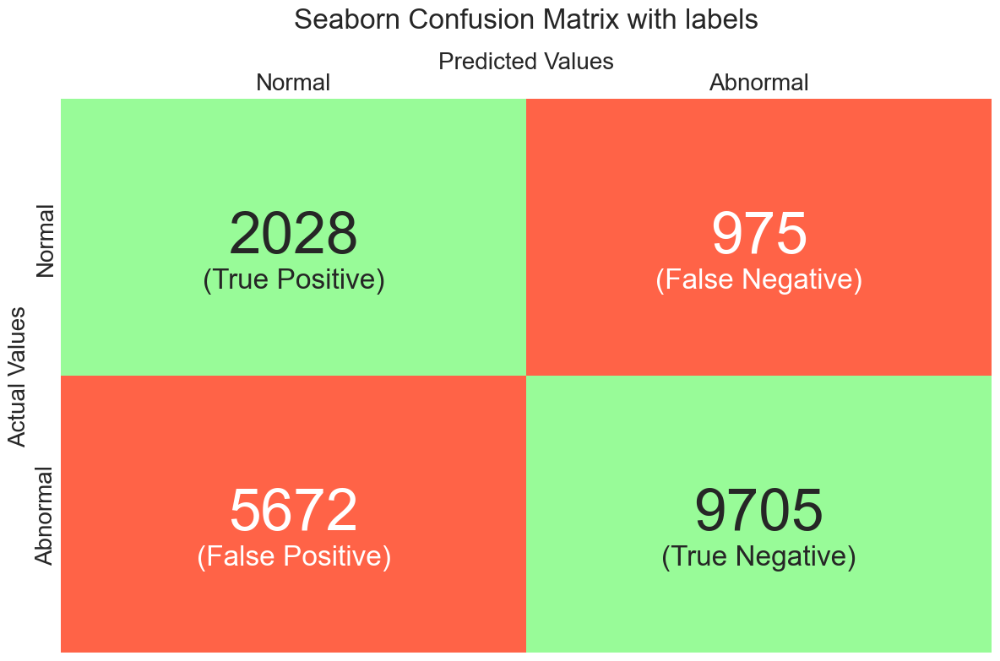

Accuracy: 0.6383569096844396 
 F1 score: 0.3789591703260768 
 Sensitivity: 0.6753246753246753 
 Specificity: 0.6311374130194446 
 ROC AUC score: 0.65323104417206 
 False Allarm Rate: 0.3246753246753247, Missed Allarm Rate: 0.36886258698055535 
 Confusion Matrix: 
 [[2028  975]
 [5672 9705]] 
 Classification Report: 
               precision    recall  f1-score   support

           0       0.26      0.68      0.38      3003
           1       0.91      0.63      0.74     15377

    accuracy                           0.64     18380
   macro avg       0.59      0.65      0.56     18380
weighted avg       0.80      0.64      0.69     18380
 



In [121]:
from time import sleep

y_preds = []
for i, recon_error in enumerate(reconstruction_errors):
    
    if recon_error > best_th:
        y_preds.append(1)
    else:
        y_preds.append(0)
                
    y = all_y[i]
        
metrics, to_print = validate_model(all_y, y_preds)
auc_score = metrics["auc_score"]
print(to_print)

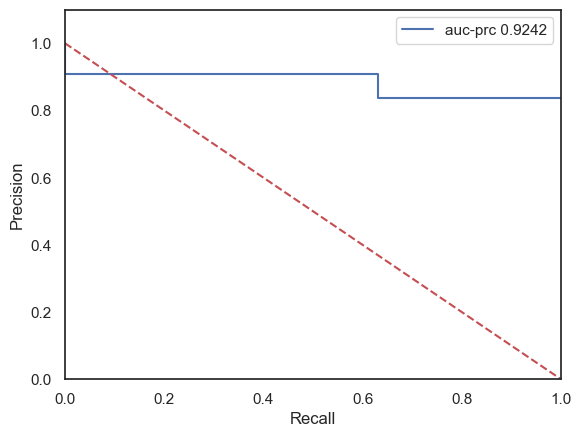

In [226]:
from sklearn.metrics import PrecisionRecallDisplay, precision_recall_curve

prec, recall, _ = precision_recall_curve(all_y, y_preds)
auc_pr = auc(recall, prec)
pr_display = PrecisionRecallDisplay(precision=prec, recall=recall).plot(label="auc-prc {}".format(round(auc_pr, 4)))
plt.plot([0, 1], [1, 0], "--r")
plt.xlim([0, 1])
plt.ylim([0, 1.1])
plt.legend()

In [227]:
y_preds_patient = {}
patients_missclassified = []
recons_all = {}
signal_all = {} 
normal_mse_patient = []
abnormal_mse_patient = []
recon_error_patient = {}

for i, (patient_signal, w) in enumerate(map_windows.items()):
    print(i+1, "/", len(map_windows.keys()), patient, end="\r")
    windows = all_windows[w] 
    windows = torch.unsqueeze(windows, dim = 1)
    test = y_all_patient[patient_signal]
    recons_signal, pred, recon_error, predictions  = isSignalAnomalous(patient_signal, windows, best_th, test, n_anomalies_th = 1, model = model_s) 
    patient = patient_signal.split("/")[0]
    signal = patient_signal.split("/")[1]
    recon_error_patient[patient_signal] = recon_error
    signals_all[patient_signal] = signals[patient][signal]
    recons_all[patient_signal] = recons_signal
    y_preds_patient[patient_signal] = pred
    #print(y_preds_patient)
    if test != pred:
        patients_missclassified.append(patient_signal)
    if test == 0:
        normal_mse_patient.append(recon_error)
    else:
        abnormal_mse_patient.append(recon_error)
        

Patient: patient235/s0461_re.dat Target: 0 Prediction:  0 Windows label: [0] Windows counts: [38]
Patient: patient169/s0329lre.dat Target: 0 Prediction:  0 Windows label: [0] Windows counts: [37]
Patient: patient248/s0481_re.dat Target: 0 Prediction:  1 Windows label: [1] Windows counts: [38]
Patient: patient174/s0325lre.dat Target: 0 Prediction:  0 Windows label: [0] Windows counts: [37]
Patient: patient156/s0299lre.dat Target: 0 Prediction:  1 Windows label: [1] Windows counts: [37]
Patient: patient234/s0460_re.dat Target: 0 Prediction:  0 Windows label: [0] Windows counts: [38]
Patient: patient236/s0463_re.dat Target: 0 Prediction:  1 Windows label: [0 1] Windows counts: [35  3]
Patient: patient276/s0526_re.dat Target: 0 Prediction:  1 Windows label: [0 1] Windows counts: [ 1 37]
Patient: patient155/s0301lre.dat Target: 0 Prediction:  1 Windows label: [0 1] Windows counts: [36  1]
Patient: patient260/s0496_re.dat Target: 0 Prediction:  0 Windows label: [0] Windows counts: [38]
Patie

In [229]:
y_test_f = []
y_preds_s = []

for patient, test in y_all_patient.items():

    pred = y_preds_patient[patient]
    y_test_f.append(test)
    y_preds_s.append(pred)

In [230]:
len(y_preds_s), len(y_test_f)

(522, 522)

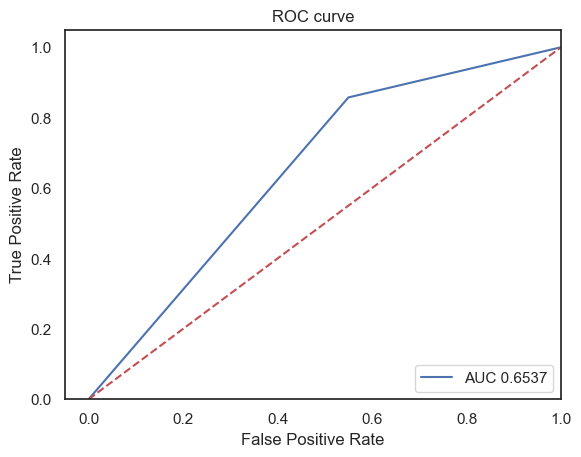

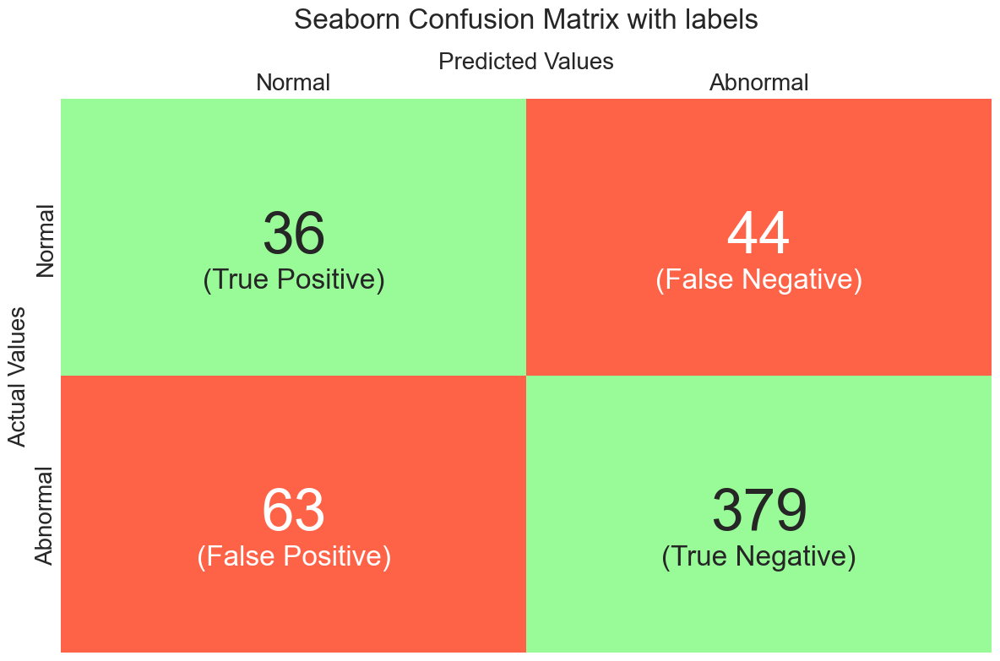

Accuracy: 0.7950191570881227 
 F1 score: 0.40223463687150834 
 Sensitivity: 0.45 
 Specificity: 0.8574660633484162 
 ROC AUC score: 0.653733031674208 
 False Allarm Rate: 0.55, Missed Allarm Rate: 0.1425339366515837 
 Confusion Matrix: 
 [[ 36  44]
 [ 63 379]] 
 Classification Report: 
               precision    recall  f1-score   support

           0       0.36      0.45      0.40        80
           1       0.90      0.86      0.88       442

    accuracy                           0.80       522
   macro avg       0.63      0.65      0.64       522
weighted avg       0.81      0.80      0.80       522
 



In [231]:
rocauc, to_print = validate_model(y_test_f, y_preds_s)
print(to_print)#0.8395079185520362

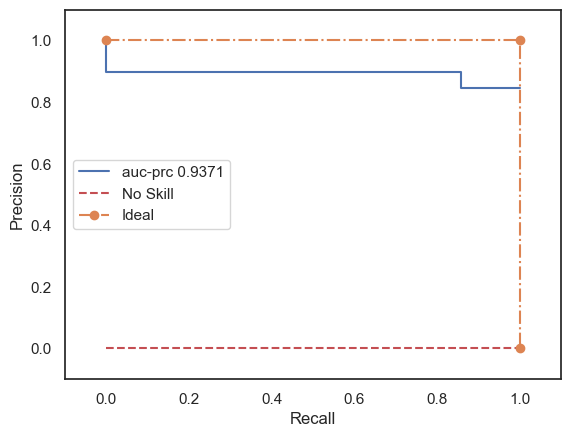

In [232]:
from sklearn.metrics import PrecisionRecallDisplay, precision_recall_curve

prec, recall, _ = precision_recall_curve(y_test_f, y_preds_s)
auc_pr = auc(recall, prec)
pr_display = PrecisionRecallDisplay(precision=prec, recall=recall).plot(label="auc-prc {}".format(round(auc_pr, 4)))
plt.plot([0, 1], [0, 0], "--r", label = "No Skill")
plt.plot([0, 1, 1], [1, 1, 0], "-.o", label = "Ideal")
plt.xlim([-0.1, 1.1])
plt.ylim([-0.1, 1.1])
plt.legend()

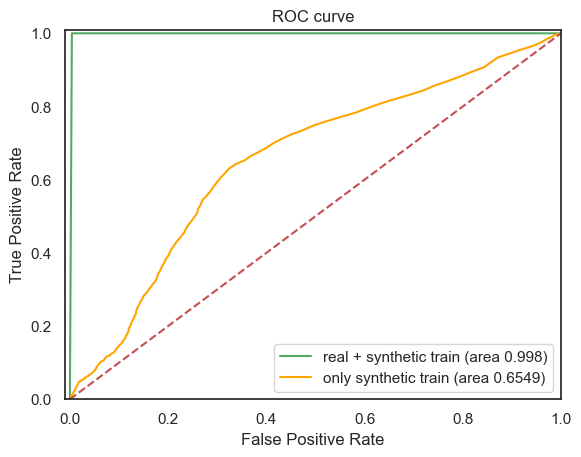

In [154]:
roc_auc = round(auc(sorted(fprs), sorted(tprs)), 4)
roc_auc1 = round(auc(sorted(fprs_s), sorted(tprs_s)), 4)

plt.title('ROC curve')
plt.plot(sorted(fprs), sorted(tprs), 'g', label = 'real + synthetic train (area {})'.format(roc_auc))
plt.plot(sorted(fprs_s), sorted(tprs_s), 'orange', label = 'only synthetic train (area {})'.format(roc_auc1))
plt.legend(loc = 'lower right')
plt.plot(labels, labels,'r--')
plt.xlim([-0.01,  1.0])
plt.ylim([0.0, 1.01])
plt.ylabel('True Positive Rate')
plt.xlabel('False Positive Rate')
plt.savefig("test_on_real_data.png", dpi = 600)

In [132]:
map_y_final[y]

'Anomalous'

Anomalous Anomalous
0.032075002789497375


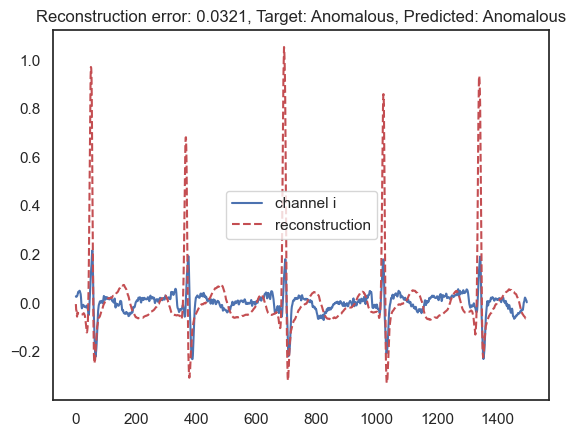

In [142]:
idx_abnormal = np.argwhere(np.array(list(y_test_patient.values())) == 1)[10][0]
patient = np.array(list(y_test_patient.keys()))[idx_abnormal]
w = map_windows[patient]
windows = all_windows[w]
x_abnormal = windows[0][:, :interval].to(device)
input = torch.unsqueeze(torch.unsqueeze(x_abnormal, dim = 0), dim = 1)
recon_abnormal = model(input)
reconstruction_error = F.mse_loss(recon_abnormal, input).item()
if reconstruction_error >= best_th:
    pred = "Anomalous"
else:
    pred = "Normal"
    
y = "Anomalous"

print(y, pred)
ch = 0
print(reconstruction_error)
plt.plot(x_abnormal[ch, :1500].cpu().detach().numpy(), label = "channel {}".format(channels[ch]))
plt.plot(recon_abnormal[0, 0, ch, :1500].cpu().detach().numpy(), "--r", label = "reconstruction")
plt.title("Reconstruction error: {}, Target: {}, Predicted: {}".format(round(reconstruction_error , 4), y,  pred))
plt.legend()
#plt.savefig("reconstruction_anomalous.png")

In [145]:
best_th

0.0026000000000000007

0.009058105759322643


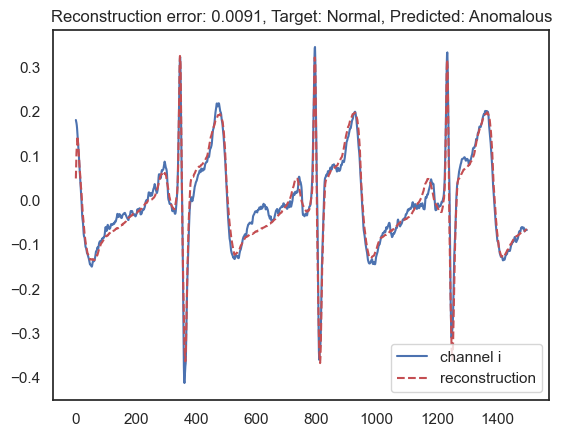

In [144]:
idx_normal = np.argwhere(np.array(list(y_test_patient.values())) == 0)[0][0]
patient = np.array(list(y_test_patient.keys()))[idx_normal]
w = map_windows[patient]
windows = all_windows[w]
x_normal = windows[0][:, :interval].to(device)
input = torch.unsqueeze(torch.unsqueeze(x_normal, dim = 0), dim = 1)
recon_normal = model(input)
reconstruction_error = F.mse_loss(recon_normal, input).item()
if reconstruction_error >= best_th:
    pred = "Anomalous"
else:
    pred = "Normal"
    
y = "Normal"

ch = 0
print(reconstruction_error)
plt.plot(x_normal[ch, :1500].cpu().detach().numpy(), label = "channel {}".format(channels[ch]))
plt.plot(recon_normal[0, 0, ch, :1500].cpu().detach().numpy(), "--r", label = "reconstruction")
plt.title("Reconstruction error: {}, Target: {}, Predicted: {}".format(round(reconstruction_error , 4), y,  pred))
plt.legend()
#plt.savefig("reconstruction_normal.png")

0.012657619081437588


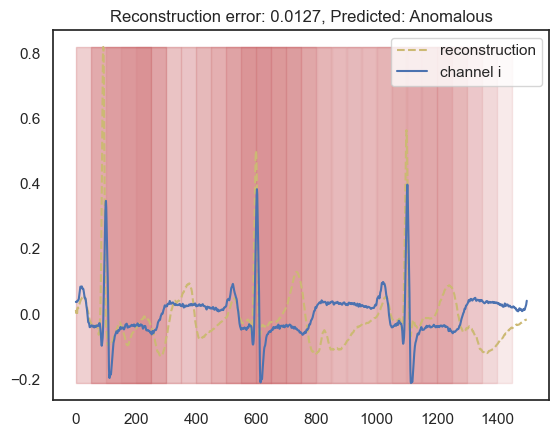

In [209]:
idx_abnormal = np.argwhere(np.array(list(y_test_patient.values())) == 1)[250][0]
patient = np.array(list(y_test_patient.keys()))[idx_abnormal]
w = map_windows[patient]
windows = all_windows[w]
x_abnormal = windows[0][:, :interval].to(device)
input = torch.unsqueeze(torch.unsqueeze(x_abnormal, dim = 0), dim = 1)
recon_abnormal = model(input)
reconstruction_error = F.mse_loss(recon_abnormal, input).item()
if reconstruction_error >= best_th:
    pred = "Anomalous"
else:
    pred = "Normal"

ch = 0
print(reconstruction_error)
plt.plot(recon_abnormal[0, 0, ch, :1500].cpu().detach().numpy(), "--y", label = "reconstruction")
plt.plot(x_abnormal[ch, :1500].cpu().detach().numpy(), "b", label = "channel {}".format(channels[ch]))
plt.title("Reconstruction error: {}, Predicted: {}".format(round(reconstruction_error , 4),  pred))

max_ = max([max(x_abnormal[ch, :1500]), max(recon_abnormal[0, 0, ch, :1500])]).item()
min_ = min([min(x_abnormal[ch, :1500]), min(recon_abnormal[0, 0, ch, :1500])]).item()

diff = abs(input-recon_abnormal)
for start in range(0, 1250, 50):
    end = start + 250
    toplot = np.arange(start, end)
    re = F.mse_loss(recon_abnormal[0, 0, :, start:end], input[0, 0, :, start:end]).item()
    alpha = re*10
    plt.fill_between(toplot, max_, min_, color = "r", alpha = alpha)
plt.legend()

0.009058105759322643


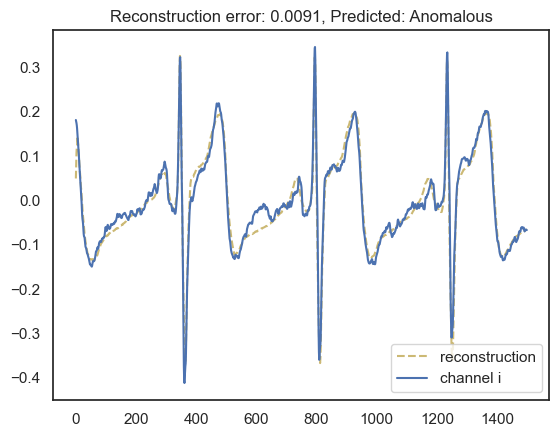

In [213]:
idx_normal = np.argwhere(np.array(list(y_test_patient.values())) == 0)[0][0]
patient = np.array(list(y_test_patient.keys()))[idx_normal]
w = map_windows[patient]
windows = all_windows[w]
x_normal = windows[0][:, :interval].to(device)
input = torch.unsqueeze(torch.unsqueeze(x_normal, dim = 0), dim = 1)
recon_normal = model(input)
reconstruction_error = F.mse_loss(recon_normal, input).item()
if reconstruction_error >= best_th:
    pred = "Anomalous"
else:
    pred = "Normal"

ch = 0
print(reconstruction_error)
plt.plot(recon_normal[0, 0, ch, :1500].cpu().detach().numpy(), "--y", label = "reconstruction")
plt.plot(x_normal[ch, :1500].cpu().detach().numpy(), "b", label = "channel {}".format(channels[ch]))
plt.title("Reconstruction error: {}, Predicted: {}".format(round(reconstruction_error , 4),  pred))

max_ = max([max(x_normal[ch, :1500]), max(recon_normal[0, 0, ch, :1500])]).item()
min_ = min([min(x_normal[ch, :1500]), min(recon_normal[0, 0, ch, :1500])]).item()

diff = abs(input-recon_abnormal)
for start in range(0, 1250, 50):
    end = start + 250
    toplot = np.arange(start, end)
    re = F.mse_loss(recon_normal[0, 0, :, start:end], input[0, 0, :, start:end]).item()
    alpha = re*10
    if alpha >= 0.01:
        print(alpha)
        plt.fill_between(toplot, max_, min_, color = "r", alpha = alpha)
plt.legend()

In [ ]:


    windows = all_windows[w]
    test = y_all_patient[patient_signal]
    print(patient_signal)
    for i, window in enumerate(windows):
        
        x = window.reshape(1, 1, 15, 2000).to(device) 
        recon = model(x).reshape(15, 2000)
        reconstruction_error = F.mse_loss(x[:, :, :, :1500], recon[:, :1500]).item()
        if reconstruction_error >= best_th:
            pred = 1
        else:
            pred = 0
        
        if test != pred:
            ch = 0
            plt.plot(window[ch, :1500], label = "channel {}".format(channels[ch]))
            plt.plot(recon[ch, :1500].cpu().detach().numpy(), "--r", label = "reconstruction")
            plt.title("Patient: {}, Window: {}, Reconstruction error: {}, Target: {}, Prediction: {}".format(patient, i, round(reconstruction_error , 4), map_y_final[test], map_y_final[pred]))
            plt.legend()
            plt.savefig("patient{}_window{}_missclassified.png".format(patient, i), dpi=300, bbox_inches='tight')
            plt.clf()

In [295]:
patients_windows_missclassified

['patient236/s0462_re.dat',
 'patient150/s0287lre.dat',
 'patient249/s0484_re.dat',
 'patient250/s0485_re.dat']

In [307]:
for patient_signal in patients_windows_missclassified:

    patient = patient_signal.split("/")[0]
    signal = patient_signal.split("/")[1]
    w = map_windows[patient_signal]
    windows = all_windows[w]
    test = y_all_patient[patient_signal]
    for i, window in enumerate(windows):
        
        input = window.reshape(1, 1, 15, 2000).to(device) 
        recon = model(input).reshape(15, 2000)
        reconstruction_error = F.mse_loss(input[:, :, :, :1500], recon[:, :1500]).item()
        if reconstruction_error >= best_th:
            pred = 1
        else:
            pred = 0
        
        if test != pred:
            ch = 0
            plt.plot(recon[ch, :1500].cpu().detach().numpy(), "--y", label = "reconstruction")
            plt.plot(window[ch, :1500].cpu().detach().numpy(), "b", label = "channel {}".format(channels[ch]))

            max_ = max([max(window[ch, :1500]), max(recon[ch, :1500])]).item()
            min_ = min([min(window[ch, :1500]), min(recon[ch, :1500])]).item()

            diff = abs(input-recon)
            toplots = []
            res = []
            for start in range(0, 1250, 50):
                end = start + 250
                toplot = np.arange(start, end)
                re = F.mse_loss(recon[:, start:end], window[:, start:end].to(device)).item()
                toplots.append(toplot)
                res.append(re)

            idx = np.argsort(res)
            res = np.array(res)
            toplots = np.array(toplots)
            res = res[idx]
            toplots = toplots[idx]

            for j, toplot in enumerate(toplots):
                re = res[j]*10
                plt.fill_between(toplot, max_, min_, color = "r", alpha = re)

            plt.title("Patient: {}, Window: {}, Reconstruction error: {}, Target: {}, Prediction: {}".format(patient, i, round(reconstruction_error , 4), map_y_final[test], map_y_final[pred]))
            plt.legend()
            plt.savefig("patient{}_window{}_missclassified.png".format(patient, i), dpi=300, bbox_inches='tight')
            plt.clf()

C:\Users\Utente\AppData\Local\Temp\ipykernel_15724\2498183107.py:12: UserWarning:

Using a target size (torch.Size([15, 1500])) that is different to the input size (torch.Size([1, 1, 15, 1500])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.



<Figure size 640x480 with 0 Axes>

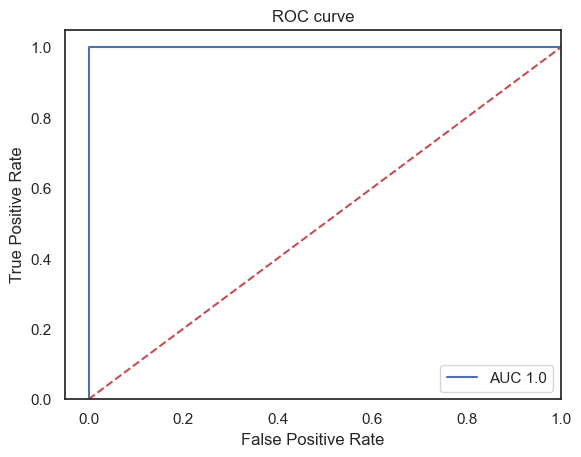

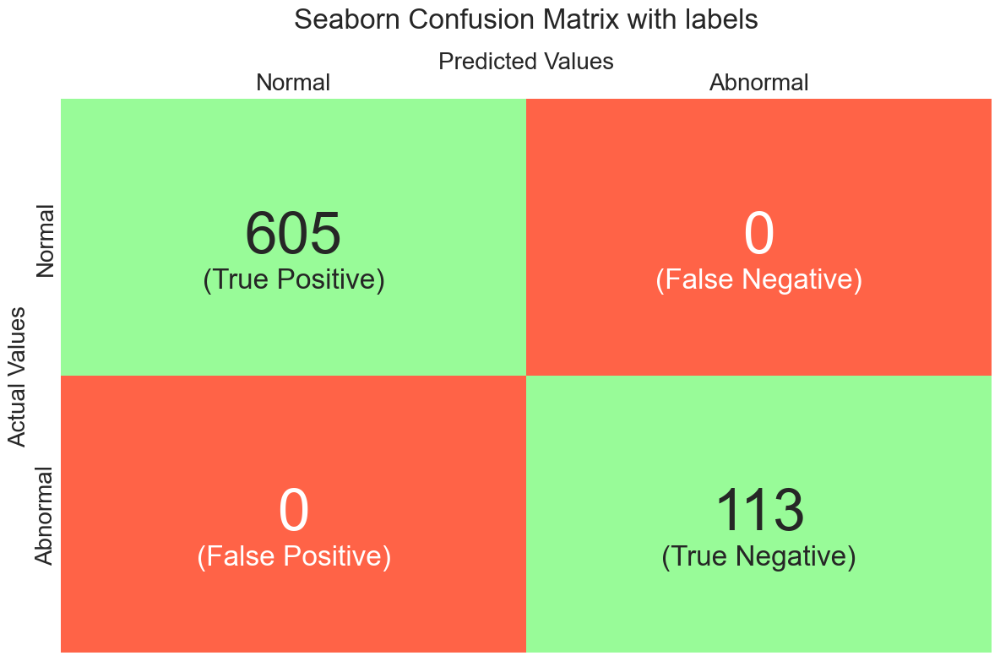

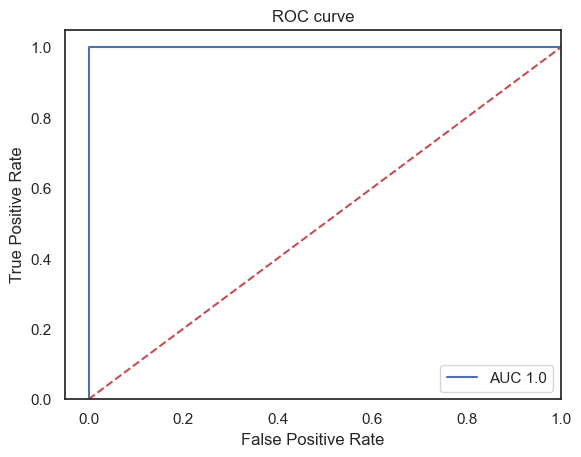

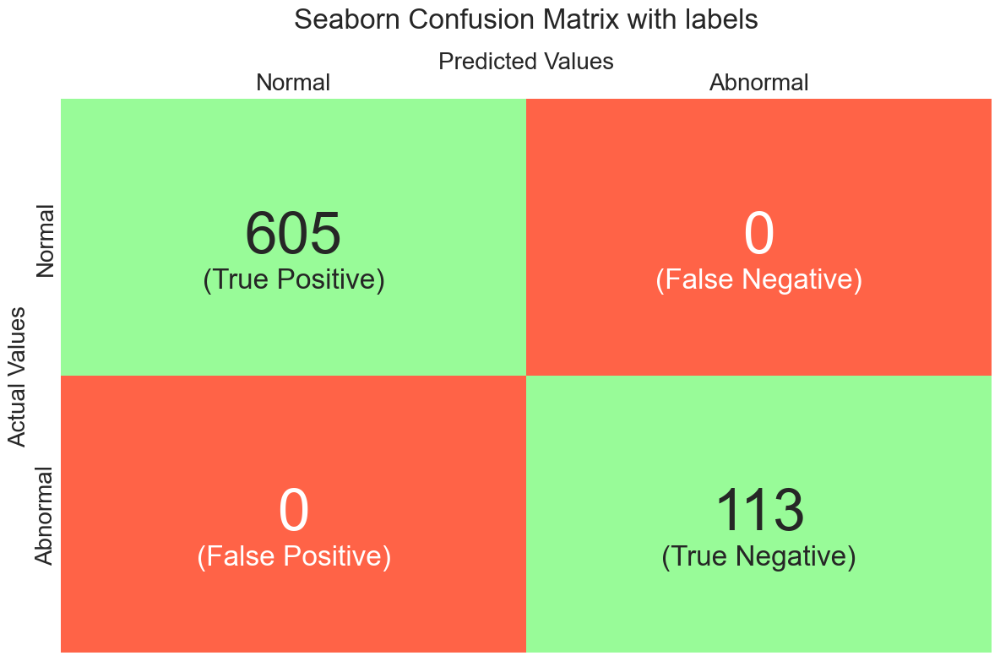

Accuracy: 1.0 
 F1 score: 1.0 
 Sensitivity: 1.0 
 Specificity: 1.0 
 ROC AUC score: 1.0 
 False Allarm Rate: 0.0, Missed Allarm Rate: 0.0 
 Confusion Matrix: 
 [[605   0]
 [  0 113]] 
 Classification Report: 
               precision    recall  f1-score   support

         0.0       1.00      1.00      1.00       605
         1.0       1.00      1.00      1.00       113

    accuracy                           1.00       718
   macro avg       1.00      1.00      1.00       718
weighted avg       1.00      1.00      1.00       718
 



In [164]:
from torch.functional import F 
from time import sleep 

metrics_uq = {}
recon_errors_uq = {}
best_th_uq = {}
for key, windows_labels in windows_uq.items():
    
    print(key, " vs ", "Healthy Control")
    y_test = [elem.item() for elem in windows_labels["y_test"]]
    windows_test = windows_labels["windows"]

    fs = 500 
    nchs = 15 
    interval2 = 1500
    interval = 2000
    reconstruction_errors = []
    n = windows_test.shape[0]

    for i, batch_data in enumerate(windows_test): 

        batch_data = batch_data.to(device)
        #print(batch_data.shape)
        batch_data = torch.unsqueeze(batch_data, dim = 0).to(device)
        batch_data = torch.unsqueeze(batch_data, dim = 0)
        #print(batch_data.shape)
        reconstruction_all = np.zeros((nchs, interval2))        

        with torch.no_grad():

            reconstruction = model(batch_data)
            reconstruction_error = F.mse_loss(reconstruction[0, 0, :, :interval2], batch_data[0, 0, :, :interval2]).item()
            print(i+1, "/", n, "Recon error:", round(reconstruction_error, 6), end = "\r")
            reconstruction_errors.append(reconstruction_error)
            recon_np = (reconstruction[0, 0, :, :interval2].cpu().detach().numpy()).reshape(1, nchs, interval2)
            reconstruction_all[:, :] = recon_np[0, :, :interval2]

            torch.cuda.empty_cache()

    recon_errors_uq[key] = reconstruction_errors
    
    best_th = 0.0
    best_auc = 0.0
    normal_mse = []
    anomalous_mse = []
    count_decr = 0 

    thresholds = np.arange(0.0009, 0.1, 0.00005)
    for j, threshold in enumerate(thresholds):
        print(threshold)
        y_preds = []
        for i, recon_error in enumerate(reconstruction_errors):

            if j == 0:
                if y_test[i] == 0:
                    normal_mse.append(recon_error)
                else:
                    anomalous_mse.append(recon_error)

            if recon_error > threshold:
                y_preds.append(1)
            else:
                y_preds.append(0)

            y = y_test[i]

        sleep(0.5)
        clear_output(wait = True)
        metrics, to_print = validate_model(y_test, y_preds)
        auc_score = metrics["auc_score"]
        if auc_score > best_auc:
            best_th = threshold
            best_auc = auc_score
        if auc_score < best_auc:
            count_decr += 1
        if count_decr >= 10: 
            break
        if best_auc == 1:
            break
        print(to_print)
    
    best_th_uq[key] = best_th
    
    y_preds = []
    for i, recon_error in enumerate(reconstruction_errors):

        if recon_error > best_th:
            y_preds.append(1)
        else:
            y_preds.append(0)

        y = y_test[i]

    metrics, to_print = validate_model(y_test, y_preds)
    metrics_uq[key] = to_print
    
    auc_score = metrics["auc_score"]
    print(to_print)

In [ ]:
for key, windows_labels in windows_uq.items():
    
    print(key, " vs ", "Healthy Control")
    y_test = [elem.item() for elem in windows_labels["y_test"]]
    reconstruction_errors = recon_errors_uq[key] 
    best_th = best_th_uq[key]
    print(best_th)
    y_preds = []
    for i, recon_error in enumerate(reconstruction_errors):

        if recon_error > best_th:
            y_preds.append(1)
        else:
            y_preds.append(0)

        y = y_test[i]

    metrics, to_print = validate_model(y_test, y_preds)
    metrics_uq1[key] = to_print
    
    auc_score = metrics["auc_score"]
    print(to_print)

Bundle branch block  vs  Healthy Control


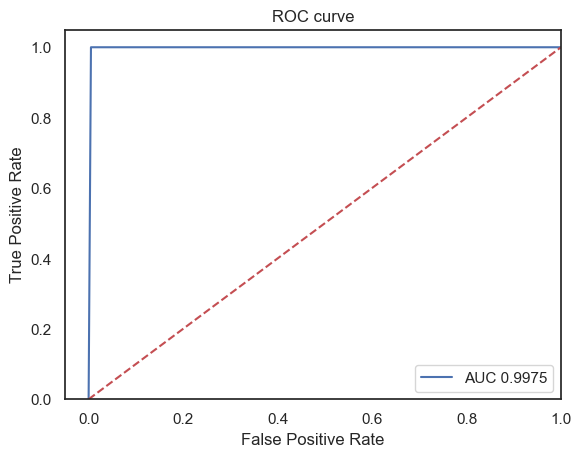

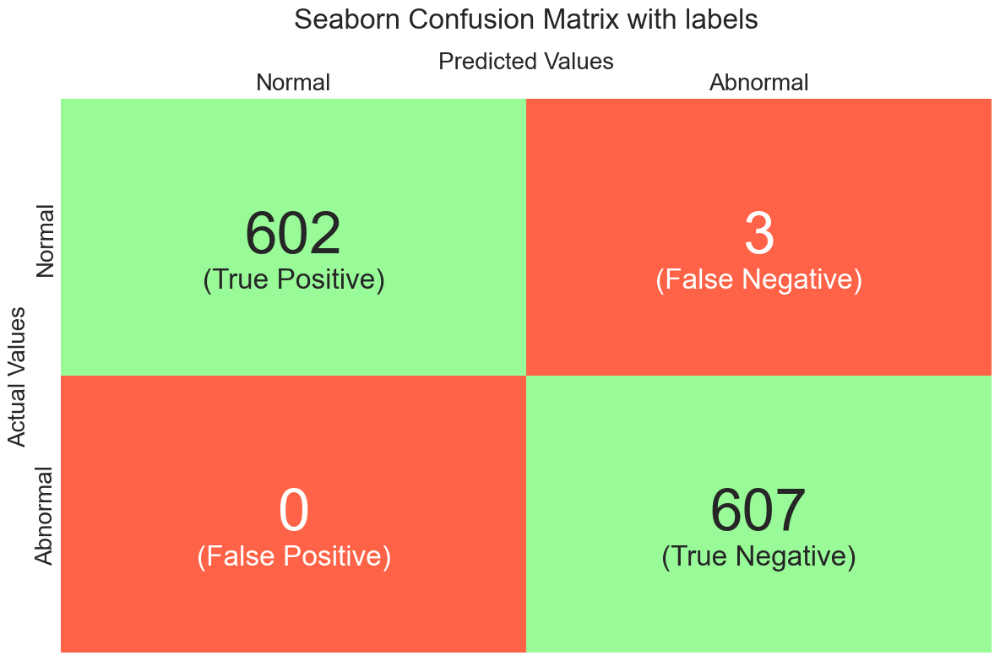

Accuracy: 0.9975247524752475 
 F1 score: 0.9975144987572493 
 Sensitivity: 0.9950413223140496 
 Specificity: 1.0 
 ROC AUC score: 0.9975206611570249 
 False Allarm Rate: 0.0049586776859504135, Missed Allarm Rate: 0.0 
 Confusion Matrix: 
 [[602   3]
 [  0 607]] 
 Classification Report: 
               precision    recall  f1-score   support

         0.0       1.00      1.00      1.00       605
         1.0       1.00      1.00      1.00       607

    accuracy                           1.00      1212
   macro avg       1.00      1.00      1.00      1212
weighted avg       1.00      1.00      1.00      1212
 

Cardiomyopathy  vs  Healthy Control


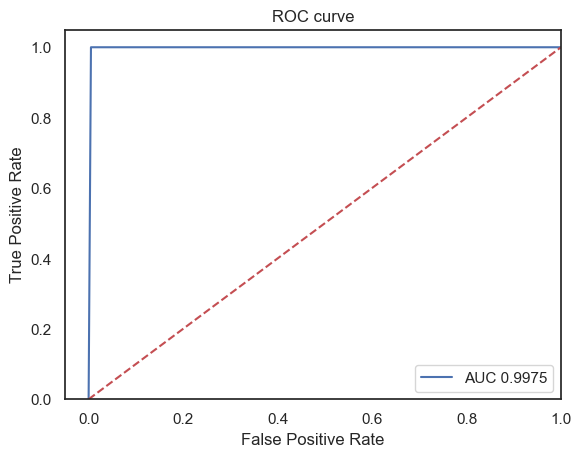

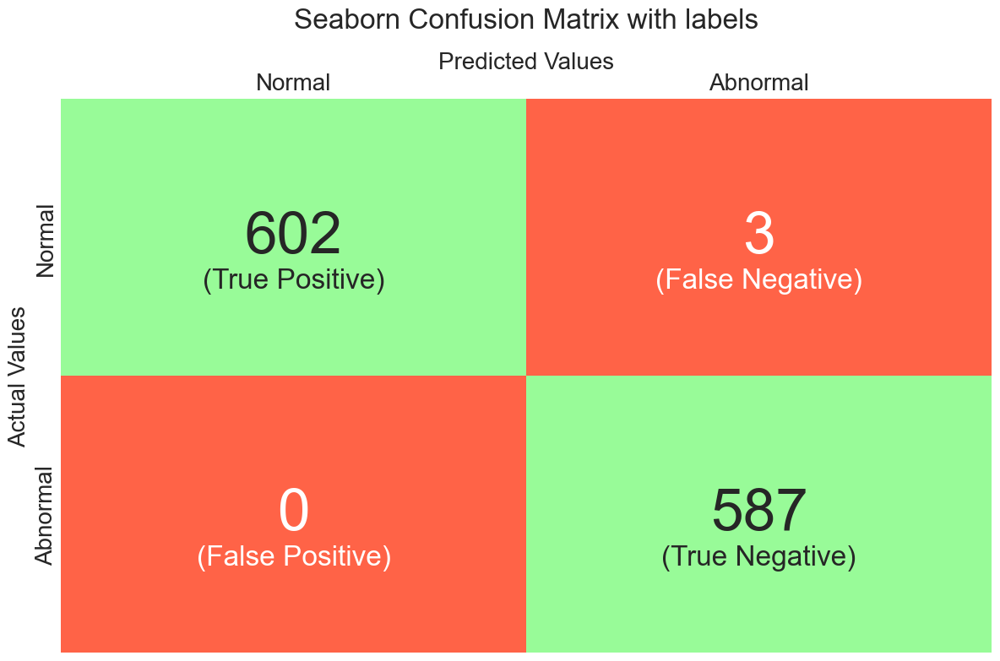

Accuracy: 0.99748322147651 
 F1 score: 0.9975144987572493 
 Sensitivity: 0.9950413223140496 
 Specificity: 1.0 
 ROC AUC score: 0.9975206611570249 
 False Allarm Rate: 0.0049586776859504135, Missed Allarm Rate: 0.0 
 Confusion Matrix: 
 [[602   3]
 [  0 587]] 
 Classification Report: 
               precision    recall  f1-score   support

         0.0       1.00      1.00      1.00       605
         1.0       0.99      1.00      1.00       587

    accuracy                           1.00      1192
   macro avg       1.00      1.00      1.00      1192
weighted avg       1.00      1.00      1.00      1192
 

Dysrhythmia  vs  Healthy Control


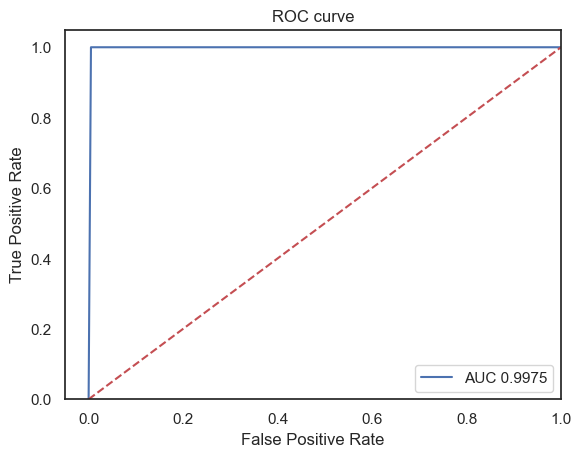

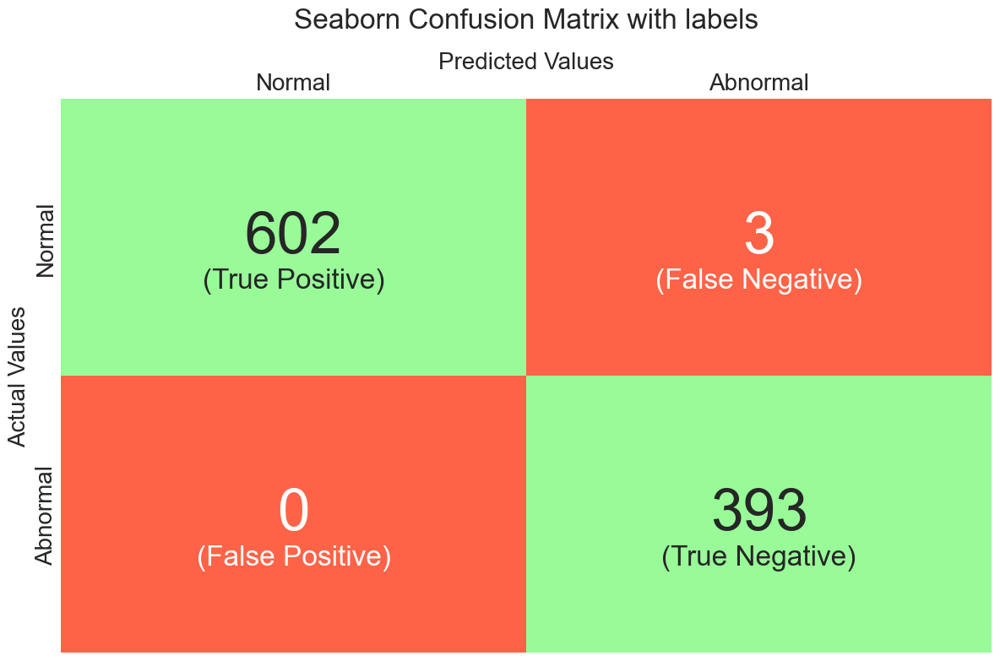

Accuracy: 0.996993987975952 
 F1 score: 0.9975144987572493 
 Sensitivity: 0.9950413223140496 
 Specificity: 1.0 
 ROC AUC score: 0.9975206611570249 
 False Allarm Rate: 0.0049586776859504135, Missed Allarm Rate: 0.0 
 Confusion Matrix: 
 [[602   3]
 [  0 393]] 
 Classification Report: 
               precision    recall  f1-score   support

         0.0       1.00      1.00      1.00       605
         1.0       0.99      1.00      1.00       393

    accuracy                           1.00       998
   macro avg       1.00      1.00      1.00       998
weighted avg       1.00      1.00      1.00       998
 

Heart failure (NYHA 2)  vs  Healthy Control


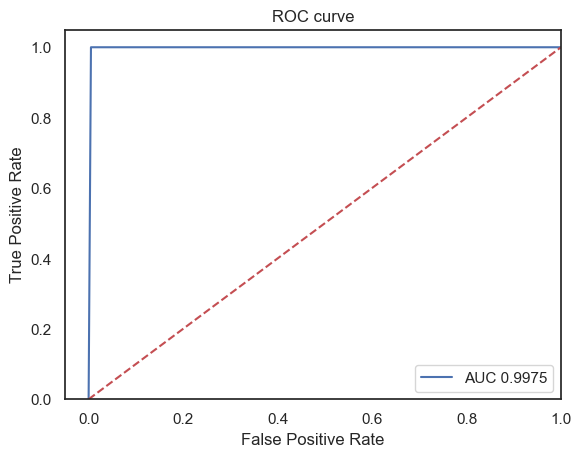

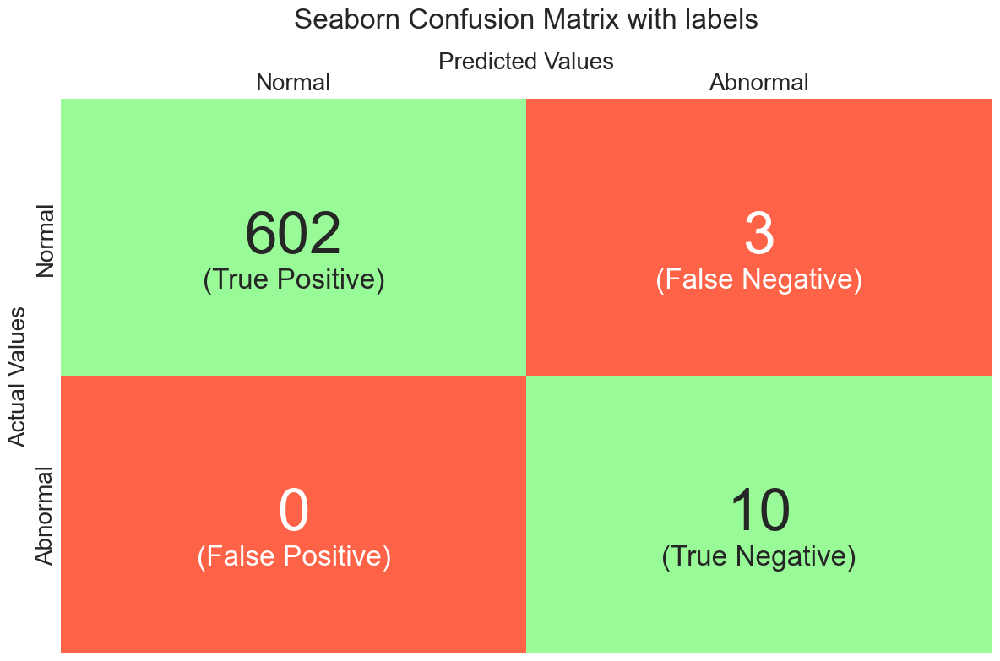

Accuracy: 0.9951219512195122 
 F1 score: 0.9975144987572493 
 Sensitivity: 0.9950413223140496 
 Specificity: 1.0 
 ROC AUC score: 0.9975206611570249 
 False Allarm Rate: 0.0049586776859504135, Missed Allarm Rate: 0.0 
 Confusion Matrix: 
 [[602   3]
 [  0  10]] 
 Classification Report: 
               precision    recall  f1-score   support

         0.0       1.00      1.00      1.00       605
         1.0       0.77      1.00      0.87        10

    accuracy                           1.00       615
   macro avg       0.88      1.00      0.93       615
weighted avg       1.00      1.00      1.00       615
 

Heart failure (NYHA 3)  vs  Healthy Control


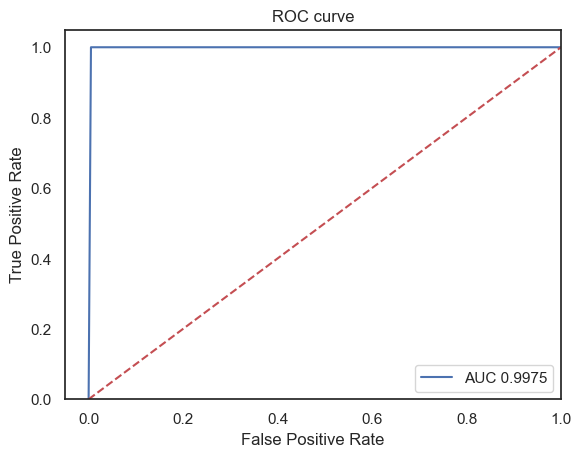

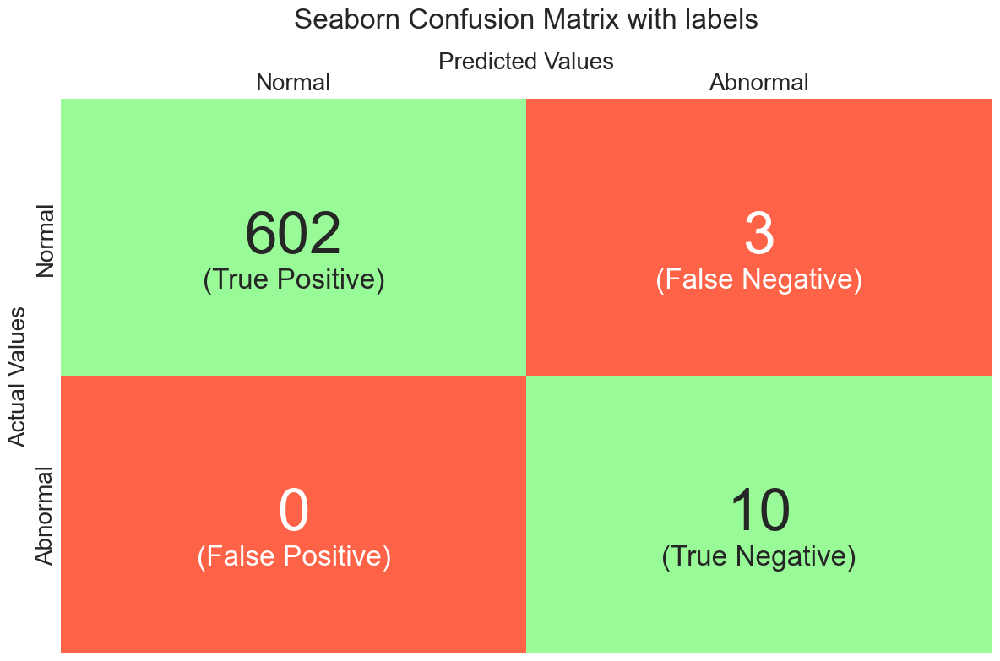

Accuracy: 0.9951219512195122 
 F1 score: 0.9975144987572493 
 Sensitivity: 0.9950413223140496 
 Specificity: 1.0 
 ROC AUC score: 0.9975206611570249 
 False Allarm Rate: 0.0049586776859504135, Missed Allarm Rate: 0.0 
 Confusion Matrix: 
 [[602   3]
 [  0  10]] 
 Classification Report: 
               precision    recall  f1-score   support

         0.0       1.00      1.00      1.00       605
         1.0       0.77      1.00      0.87        10

    accuracy                           1.00       615
   macro avg       0.88      1.00      0.93       615
weighted avg       1.00      1.00      1.00       615
 

Heart failure (NYHA 4)  vs  Healthy Control


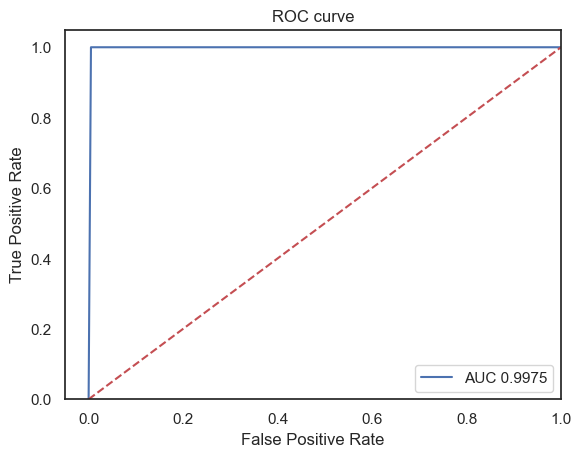

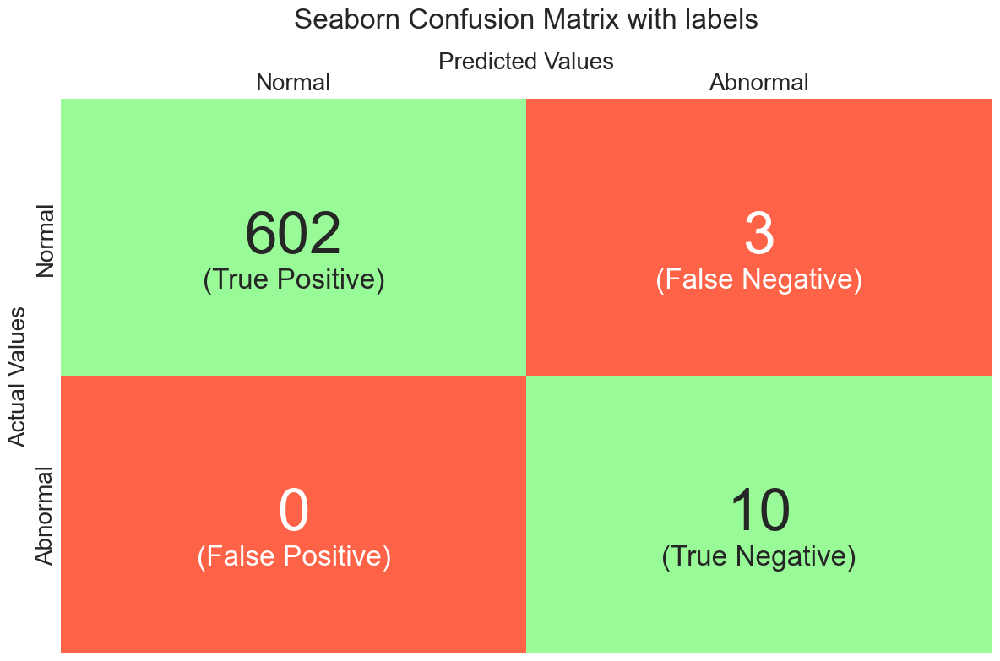

Accuracy: 0.9951219512195122 
 F1 score: 0.9975144987572493 
 Sensitivity: 0.9950413223140496 
 Specificity: 1.0 
 ROC AUC score: 0.9975206611570249 
 False Allarm Rate: 0.0049586776859504135, Missed Allarm Rate: 0.0 
 Confusion Matrix: 
 [[602   3]
 [  0  10]] 
 Classification Report: 
               precision    recall  f1-score   support

         0.0       1.00      1.00      1.00       605
         1.0       0.77      1.00      0.87        10

    accuracy                           1.00       615
   macro avg       0.88      1.00      0.93       615
weighted avg       1.00      1.00      1.00       615
 

Hypertrophy  vs  Healthy Control


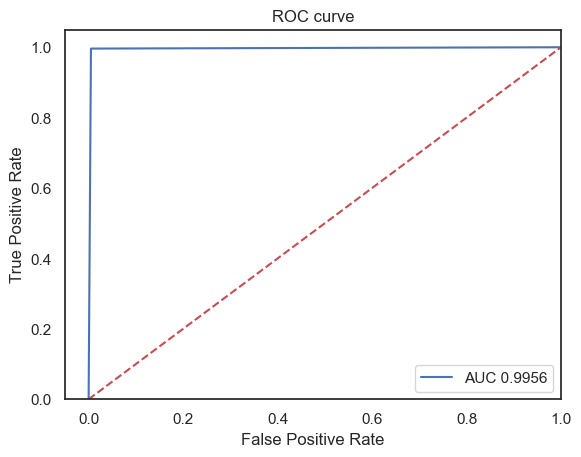

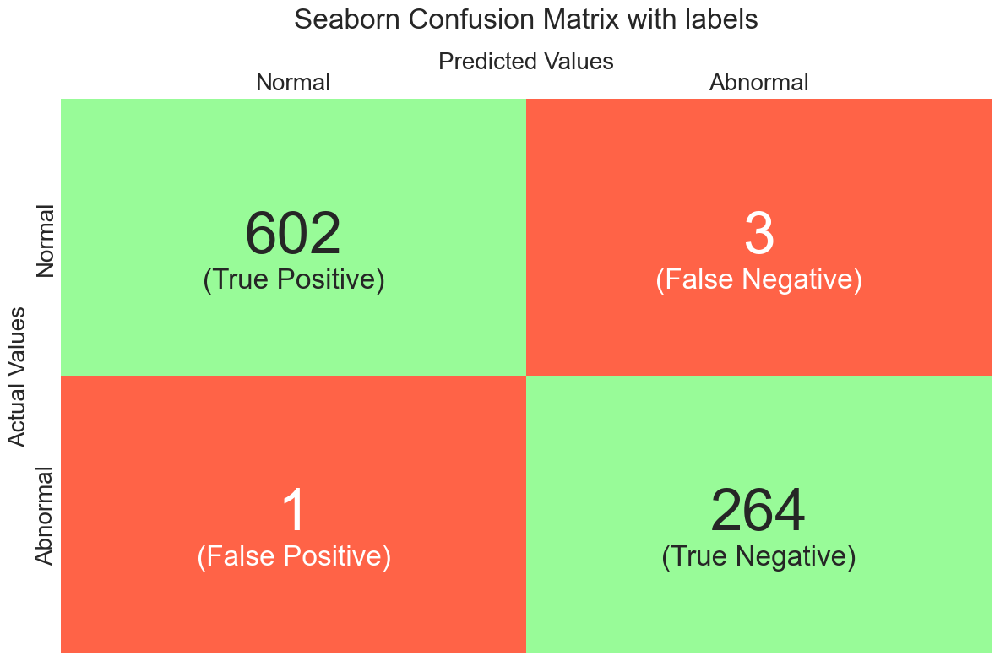

Accuracy: 0.9954022988505747 
 F1 score: 0.9966887417218543 
 Sensitivity: 0.9950413223140496 
 Specificity: 0.9962264150943396 
 ROC AUC score: 0.9956338687041947 
 False Allarm Rate: 0.0049586776859504135, Missed Allarm Rate: 0.0037735849056603774 
 Confusion Matrix: 
 [[602   3]
 [  1 264]] 
 Classification Report: 
               precision    recall  f1-score   support

         0.0       1.00      1.00      1.00       605
         1.0       0.99      1.00      0.99       265

    accuracy                           1.00       870
   macro avg       0.99      1.00      0.99       870
weighted avg       1.00      1.00      1.00       870
 

Myocardial infarction  vs  Healthy Control


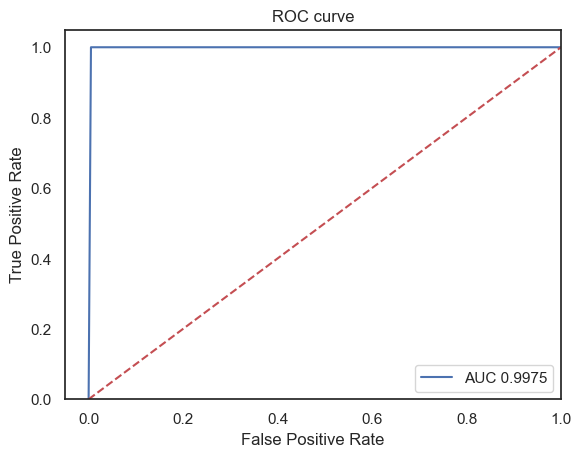

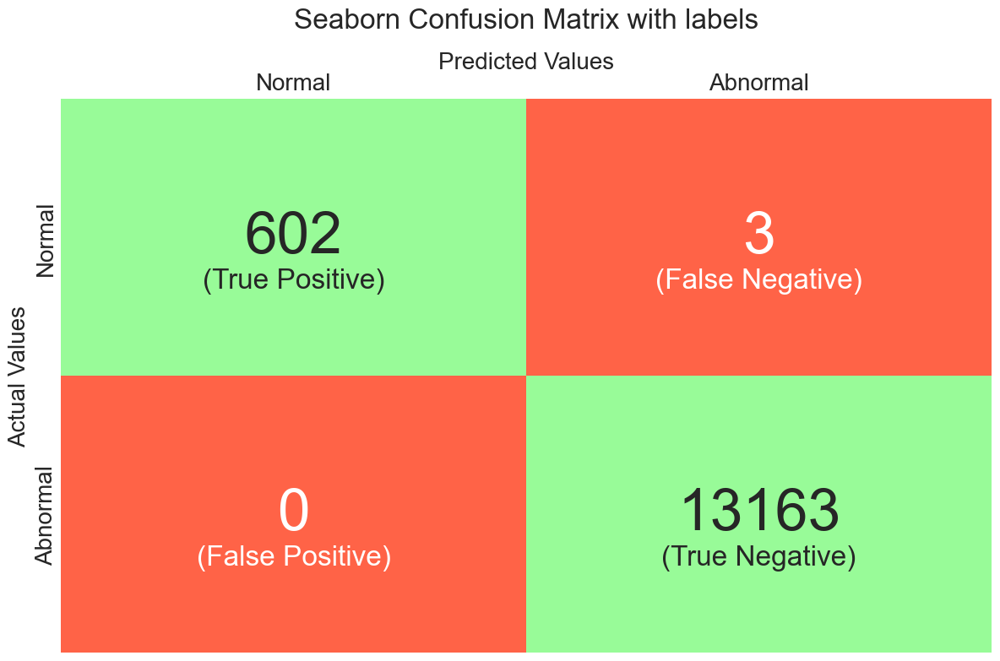

Accuracy: 0.9997821034282394 
 F1 score: 0.9975144987572493 
 Sensitivity: 0.9950413223140496 
 Specificity: 1.0 
 ROC AUC score: 0.9975206611570249 
 False Allarm Rate: 0.0049586776859504135, Missed Allarm Rate: 0.0 
 Confusion Matrix: 
 [[  602     3]
 [    0 13163]] 
 Classification Report: 
               precision    recall  f1-score   support

         0.0       1.00      1.00      1.00       605
         1.0       1.00      1.00      1.00     13163

    accuracy                           1.00     13768
   macro avg       1.00      1.00      1.00     13768
weighted avg       1.00      1.00      1.00     13768
 

Myocarditis  vs  Healthy Control


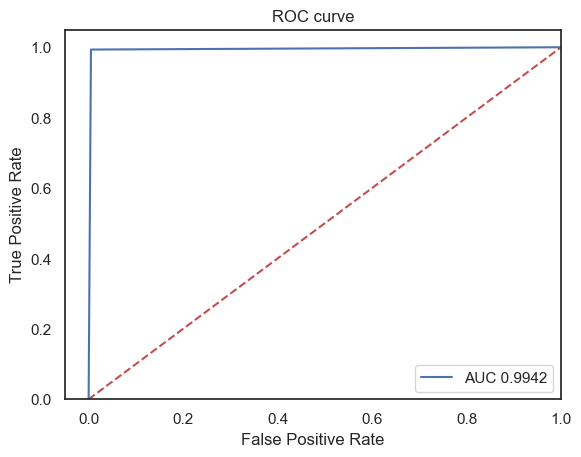

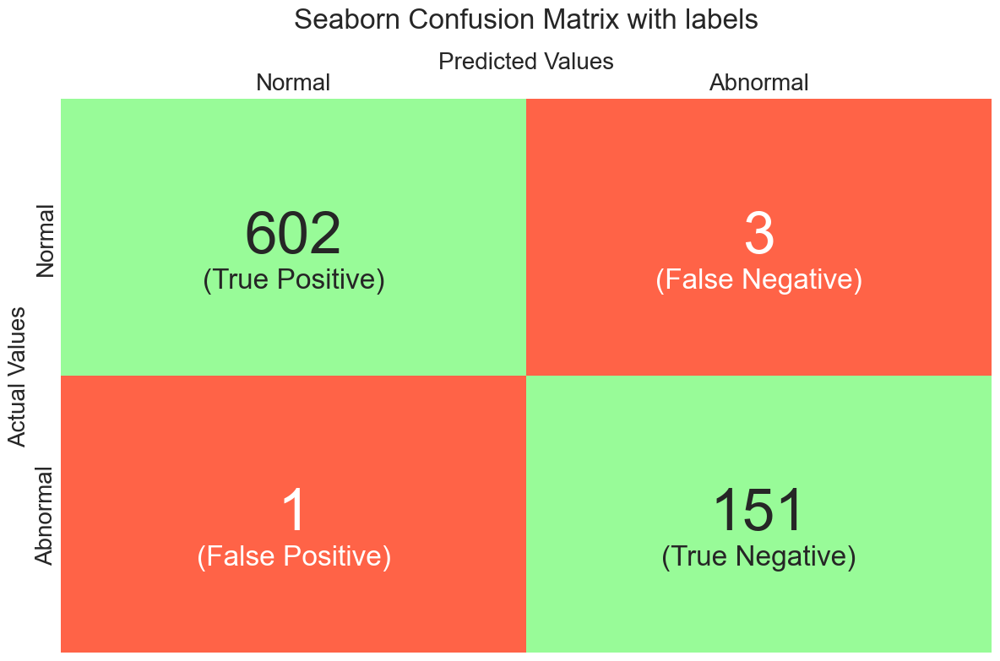

Accuracy: 0.9947159841479525 
 F1 score: 0.9966887417218543 
 Sensitivity: 0.9950413223140496 
 Specificity: 0.993421052631579 
 ROC AUC score: 0.9942311874728144 
 False Allarm Rate: 0.0049586776859504135, Missed Allarm Rate: 0.006578947368421052 
 Confusion Matrix: 
 [[602   3]
 [  1 151]] 
 Classification Report: 
               precision    recall  f1-score   support

         0.0       1.00      1.00      1.00       605
         1.0       0.98      0.99      0.99       152

    accuracy                           0.99       757
   macro avg       0.99      0.99      0.99       757
weighted avg       0.99      0.99      0.99       757
 

Palpitation  vs  Healthy Control


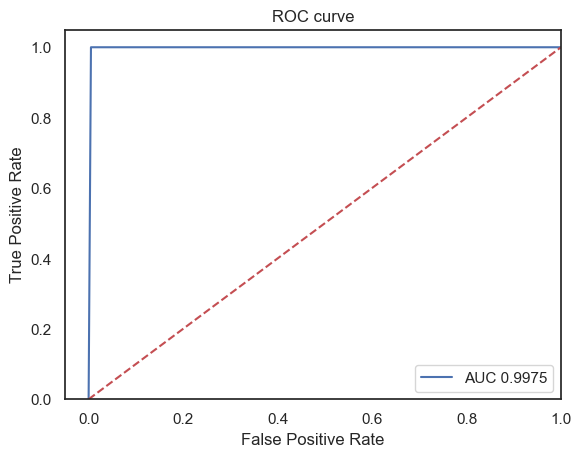

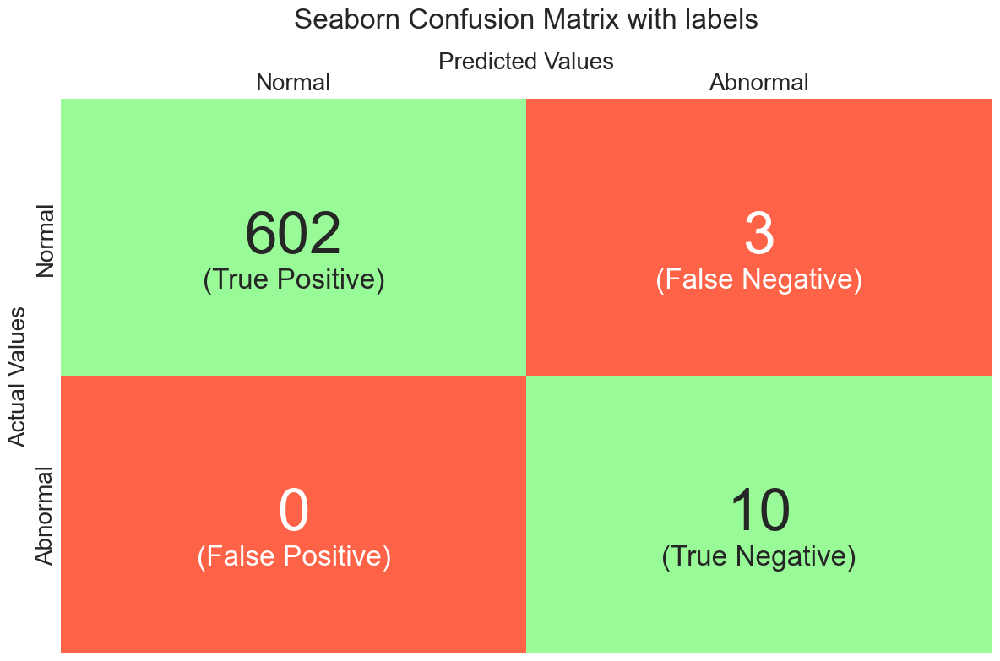

Accuracy: 0.9951219512195122 
 F1 score: 0.9975144987572493 
 Sensitivity: 0.9950413223140496 
 Specificity: 1.0 
 ROC AUC score: 0.9975206611570249 
 False Allarm Rate: 0.0049586776859504135, Missed Allarm Rate: 0.0 
 Confusion Matrix: 
 [[602   3]
 [  0  10]] 
 Classification Report: 
               precision    recall  f1-score   support

         0.0       1.00      1.00      1.00       605
         1.0       0.77      1.00      0.87        10

    accuracy                           1.00       615
   macro avg       0.88      1.00      0.93       615
weighted avg       1.00      1.00      1.00       615
 

Stable angina  vs  Healthy Control


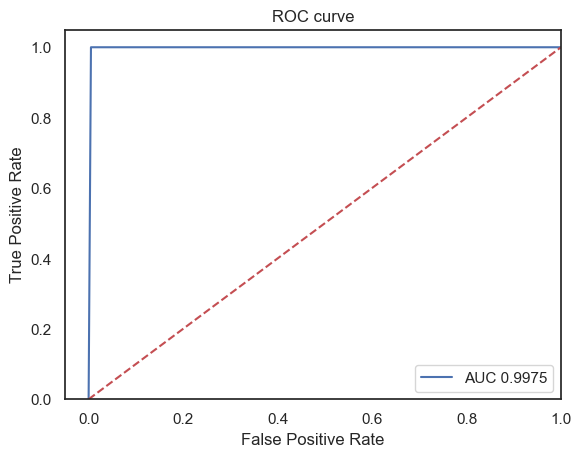

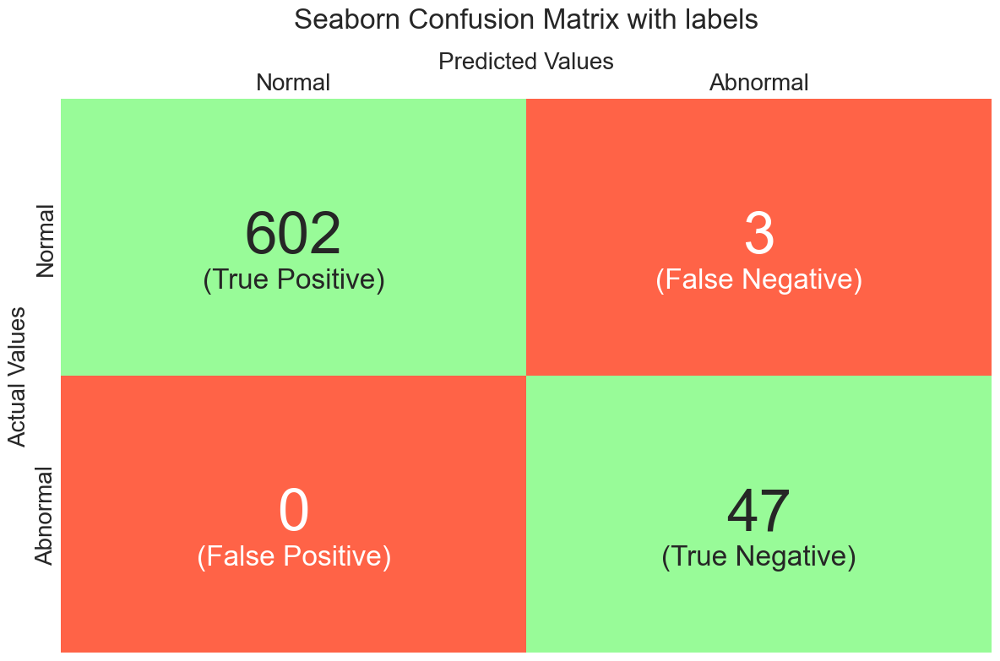

Accuracy: 0.995398773006135 
 F1 score: 0.9975144987572493 
 Sensitivity: 0.9950413223140496 
 Specificity: 1.0 
 ROC AUC score: 0.9975206611570249 
 False Allarm Rate: 0.0049586776859504135, Missed Allarm Rate: 0.0 
 Confusion Matrix: 
 [[602   3]
 [  0  47]] 
 Classification Report: 
               precision    recall  f1-score   support

         0.0       1.00      1.00      1.00       605
         1.0       0.94      1.00      0.97        47

    accuracy                           1.00       652
   macro avg       0.97      1.00      0.98       652
weighted avg       1.00      1.00      1.00       652
 

Unstable angina  vs  Healthy Control


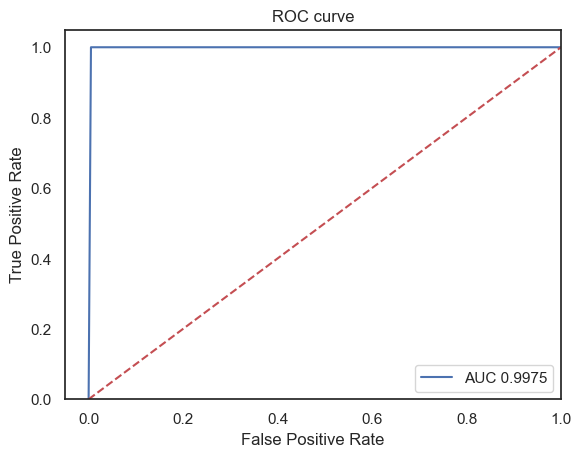

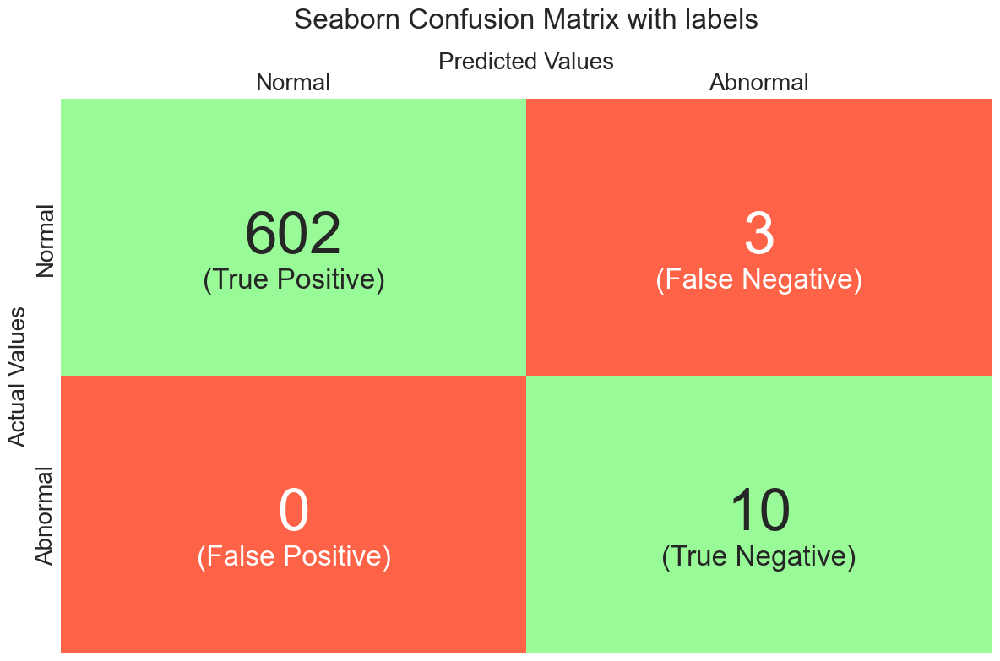

Accuracy: 0.9951219512195122 
 F1 score: 0.9975144987572493 
 Sensitivity: 0.9950413223140496 
 Specificity: 1.0 
 ROC AUC score: 0.9975206611570249 
 False Allarm Rate: 0.0049586776859504135, Missed Allarm Rate: 0.0 
 Confusion Matrix: 
 [[602   3]
 [  0  10]] 
 Classification Report: 
               precision    recall  f1-score   support

         0.0       1.00      1.00      1.00       605
         1.0       0.77      1.00      0.87        10

    accuracy                           1.00       615
   macro avg       0.88      1.00      0.93       615
weighted avg       1.00      1.00      1.00       615
 

Valvular heart disease  vs  Healthy Control


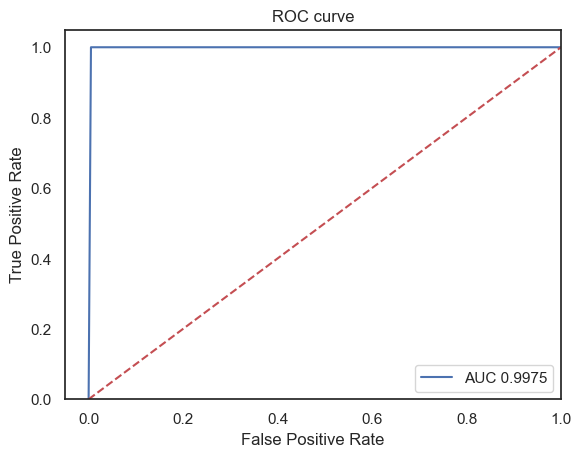

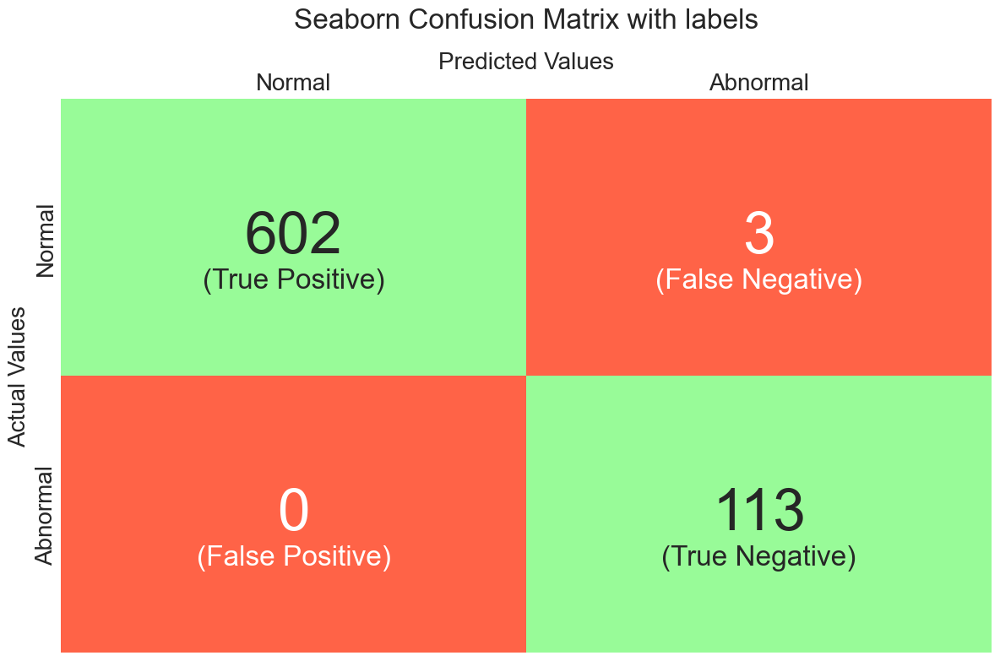

Accuracy: 0.9958217270194986 
 F1 score: 0.9975144987572493 
 Sensitivity: 0.9950413223140496 
 Specificity: 1.0 
 ROC AUC score: 0.9975206611570249 
 False Allarm Rate: 0.0049586776859504135, Missed Allarm Rate: 0.0 
 Confusion Matrix: 
 [[602   3]
 [  0 113]] 
 Classification Report: 
               precision    recall  f1-score   support

         0.0       1.00      1.00      1.00       605
         1.0       0.97      1.00      0.99       113

    accuracy                           1.00       718
   macro avg       0.99      1.00      0.99       718
weighted avg       1.00      1.00      1.00       718
 



In [169]:
best_th = 0.0026
metrics_uq1 = {}
for key, windows_labels in windows_uq.items():
    
    print(key, " vs ", "Healthy Control")
    y_test = [elem.item() for elem in windows_labels["y_test"]]
    reconstruction_errors = recon_errors_uq[key] 
    
    y_preds = []
    for i, recon_error in enumerate(reconstruction_errors):

        if recon_error > best_th:
            y_preds.append(1)
        else:
            y_preds.append(0)

        y = y_test[i]

    metrics, to_print = validate_model(y_test, y_preds)
    metrics_uq1[key] = to_print
    
    auc_score = metrics["auc_score"]
    print(to_print)